In [2]:
import sys, os, pickle
from joblib import Parallel, delayed
import pandas as pd
from jumpmodels.utils import filter_date_range
from jumpmodels.preprocess import StandardScalerPD, DataClipperStd
from jumpmodels.sparse_jump import SparseJumpModel
from sklearn.preprocessing import StandardScaler
from pypfopt.black_litterman import BlackLittermanModel, market_implied_prior_returns
from pypfopt.efficient_frontier import EfficientFrontier
import numpy as np
import matplotlib.pyplot as plt
from pypfopt import exceptions 
from scipy.optimize import brentq
import cvxpy as cp
from scipy import stats

#sys.path.append('/Users/victor/Documents/thesis_vri_vp/vic_new')         # for mac
sys.path.append('C:\\Users\\victo\\git_new\\thesis_vri_vp\\vic_new')      # for windows
# sys.path.append('/Users/vlad/Desktop/git/Masters-Thesis-VRI-VP/vic_new')         # for mac vlad
from feature_set_v2 import MergedDataLoader 

In [3]:
# 0) Global parameters ------------------------------------------------------------------
REFIT_FREQ        = "ME"        
MIN_TRAINING_YEARS= 8
MAX_TRAINING_YEARS= 12
INITIAL_TRAIN_START = "2002-05-31"
test_start        = "2017-01-01"

# Pick method to drive backtest: "grid", "bayes" or "history" ---------------------------
cv_choice = "bayes"

# Paths & tickers -----------------------------------------------------------------------
script_dir = os.getcwd()
base_dir   = os.path.abspath(os.path.join(script_dir, "..", "..", "..","..", "..","..","..",".."))
data_dir   = os.path.join(base_dir, "data_new")

factor_file = os.path.join(data_dir, "1estimation_index_returns.csv")
market_file = os.path.join(data_dir, "1macro_data.csv")
etf_file    = os.path.join(data_dir, "2trading_etf_returns_aligned.csv")

factors = ["iwf", "mtum", "qual", "size", "usmv", "vlue"]   # used everywhere

#grid_df    = pd.read_parquet("cv_params_grid_75-150.parquet")
bayes_df   = pd.read_parquet("0506_30bps_20-1000.parquet") # 7 bps 100-1000
# history_df = pd.read_parquet("cv_params_history.parquet")

In [4]:
rf_dates = pd.read_csv("rf_dates_single.csv")["rf_date"]
rf_dates = set(pd.to_datetime(rf_dates))


In [5]:
# ──────────────────────────────────────────────────────────────
# HYPERPARAMETERS
# ──────────────────────────────────────────────────────────────
df_map = {
    #"grid":    grid_df,
    "bayes":   bayes_df,
    # "history": history_df
}
cv_df = df_map[cv_choice]

# ─────────────────────────────────────────────────────
# HYPERPARAMETER SMOOTHING SETUP
# ─────────────────────────────────────────────────────
# pick one
SMOOTH_METHOD = "none"   # options: "none", "rolling_median", "ewma"
SMOOTH_WINDOW = 3        # # of folds to include in the window
# ─────────────────────────────────────────────────────

# … right after cv_df = df_map[cv_choice] …
cv_df = cv_df.sort_values(["factor","date"])

if SMOOTH_METHOD == "none":
    # simply copy original λ & κ forward
    cv_df["sm_lambda"] = cv_df["best_lambda"]
    cv_df["sm_kappa"]  = cv_df["best_kappa"]

elif SMOOTH_METHOD == "rolling_median":
    # Centered rolling median
    cv_df["sm_lambda"] = (
        cv_df
        .groupby("factor")["best_lambda"]
        .transform(lambda x: x.rolling(SMOOTH_WINDOW, min_periods=1, center=True).median())
    )
    cv_df["sm_kappa"] = (
        cv_df
        .groupby("factor")["best_kappa"]
        .transform(lambda x: x.rolling(SMOOTH_WINDOW, min_periods=1, center=True).median())
    )

elif SMOOTH_METHOD == "ewma":
    # Exponential‐weight moving average
    cv_df["sm_lambda"] = (
        cv_df
        .groupby("factor")["best_lambda"]
        .transform(lambda x: x.ewm(span=SMOOTH_WINDOW, min_periods=1).mean())
    )
    cv_df["sm_kappa"] = (
        cv_df
        .groupby("factor")["best_kappa"]
        .transform(lambda x: x.ewm(span=SMOOTH_WINDOW, min_periods=1).mean())
    )

else:
    raise ValueError(f"Unknown SMOOTH_METHOD {SMOOTH_METHOD!r}")

# ──────────────────────────────────────────────────────────────
# … after your smoothing block …

# HYPERPARAMETER BOUNDS
LAMBDA_MIN, LAMBDA_MAX = 0, 3000
KAPPA_MIN,  KAPPA_MAX  = 1,    10

cv_df["sm_lambda"] = cv_df["sm_lambda"].clip(LAMBDA_MIN, LAMBDA_MAX)
cv_df["sm_kappa"]  = cv_df["sm_kappa"].clip(KAPPA_MIN,  KAPPA_MAX)

# round κ and cast to int once
cv_df["sm_kappa"] = cv_df["sm_kappa"].round().astype(int)

# overwrite with the bounded values
cv_df["best_lambda"] = cv_df["sm_lambda"]
cv_df["best_kappa"]  = cv_df["sm_kappa"]

# (optional) drop helpers
cv_df.drop(columns=["sm_lambda","sm_kappa"], inplace=True)
# ──────────────────────────────────────────────────────────────

# ─────────────────────────────────────────────────────
# Now build saved_hyperparams exactly as before
# ─────────────────────────────────────────────────────
saved_hyperparams = {}
for fac in factors:
    sub = cv_df[cv_df["factor"] == fac].sort_values("date")
    saved_hyperparams[fac] = [
        {
            "date":      row["date"],
            "new_lambda": row["best_lambda"],
            "new_kappa":  row["best_kappa"]
        }
        for _, row in sub.iterrows()
    ]


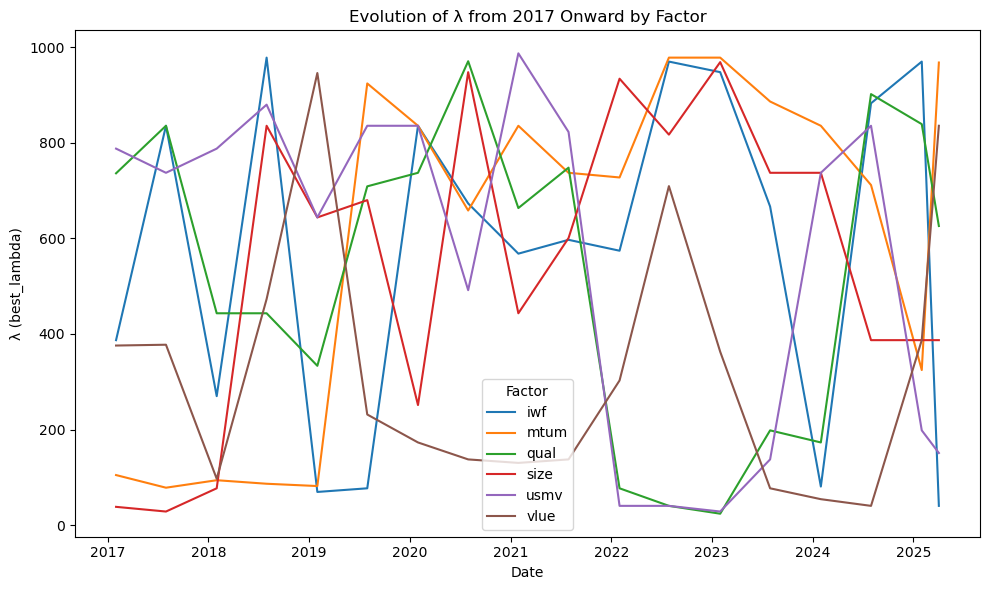

In [6]:
import matplotlib.pyplot as plt
import pandas as pd

# ensure dates are datetime
cv_df['date'] = pd.to_datetime(cv_df['date'])

# filter from 2017-01-01 forward
mask = cv_df['date'] >= pd.Timestamp('2017-01-01')
df2017 = cv_df.loc[mask]

# pivot so each factor is its own column
lambda_ts = df2017.pivot(index='date', columns='factor', values='best_lambda')

# plot
fig, ax = plt.subplots(figsize=(10, 6))
for fac in lambda_ts.columns:
    ax.plot(lambda_ts.index, lambda_ts[fac], label=fac)

ax.set_xlabel('Date')
ax.set_ylabel('λ (best_lambda)')
ax.set_title('Evolution of λ from 2017 Onward by Factor')
ax.legend(title='Factor')
plt.tight_layout()
plt.show()


In [7]:
# import matplotlib.pyplot as plt
# import pandas as pd
# mpl.rcParams['text.usetex'] = True

# # prepare data
# cv_df['date'] = pd.to_datetime(cv_df['date'])
# df2017 = cv_df[cv_df['date'] >= '2017-01-01']
# lambda_ts = df2017.pivot(index='date', columns='factor', values='best_lambda')

# # compute mean and std across factors for each date
# mean_lambda = lambda_ts.mean(axis=1)
# std_lambda  = lambda_ts.std(axis=1)

# # plot
# fig, ax = plt.subplots(figsize=(10, 6))
# ax.plot(mean_lambda.index, mean_lambda, label=r'Mean $\lambda$', lw=2)
# ax.fill_between(
#     mean_lambda.index,
#     mean_lambda - std_lambda,
#     mean_lambda + std_lambda,
#     alpha=0.2,
#     label=r'$\pm$1 $\sigma$'
# )

# ax.set_ylabel(r'Cross-validated $\lambda$')
# # ax.set_title('Average λ from 2017 Onward (with ±1 σ band)')
# ax.legend()
# ax.set_ylim(0, 1200)
# plt.tight_layout()
# plt.show()


In [8]:
# import matplotlib.pyplot as plt
# import pandas as pd
# import matplotlib as mpl
# import matplotlib.dates as mdates
# import os

# # prepare data
# df = cv_df.copy()
# df['date'] = pd.to_datetime(df['date'])
# df2017 = df[df['date'] >= '2017-01-01']
# lambda_ts = df2017.pivot(index='date', columns='factor', values='best_lambda')

# output_dir = 'factor_plots'
# os.makedirs(output_dir, exist_ok=True)


# # define year locator and formatter
# year_locator = mdates.YearLocator()
# year_formatter = mdates.DateFormatter('%Y')

# # plot each factor in its own figure, printing factor name before each plot
# for fac in lambda_ts.columns:
#     # print the factor name
#     print(f"Factor: {fac}")

#     fig, ax = plt.subplots(figsize=(10, 6))
#     ax.plot(lambda_ts.index, lambda_ts[fac], lw=1.5)
#     #ax.set_xlabel('Date')
#     ax.set_ylabel(r'Cross-validated $\lambda$')
#     ax.grid(False)

#         # set x-axis limits from 2017 onward up to mid-2025
#     ax.set_xlim(pd.Timestamp('2017-01-01'), pd.Timestamp('2025-06-30'))

#     # show ticks at each year and format to display year only
#     ax.xaxis.set_major_locator(year_locator)
#     ax.xaxis.set_major_formatter(year_formatter)
#     ax.set_ylim(0,1200)
#     fig.autofmt_xdate()

#     plt.tight_layout()
#     # save figure with factor name
#     filename = os.path.join(output_dir, f"{fac}.png")
#     fig.savefig(filename, dpi=300, bbox_inches='tight')
#     plt.close(fig)

#     print(f"Saved plot to: {filename}")


In [9]:
# ──────────────────────────────────────────────────────────────
# DATA‑LOADING BLOCK  (pulled from old notebook)
# ──────────────────────────────────────────────────────────────

# 1) Load full data for every factor + market ------------------------------------------------
factor_data_dict  = {}
factor_returns_ls = []

for fac in factors:
    print(f"Loading data for {fac}")
    data = MergedDataLoader(
        factor_file=factor_file,
        market_file=market_file,
        ver="v2",
        factor_col=fac
    ).load()

    common_idx = (data.X.index
                  .intersection(data.ret_ser.index)
                  .intersection(data.market_ser.index))

    X_full        = data.X.loc[common_idx]
    fac_ret_full  = data.ret_ser.loc[common_idx]
    mkt_ret_full  = data.market_ser.loc[common_idx]
    active_ret    = fac_ret_full - mkt_ret_full

    factor_data_dict[fac] = {
        "X"        : X_full,
        "fac_ret"  : fac_ret_full,
        "mkt_ret"  : mkt_ret_full,
        "active_ret": active_ret,
    }
    factor_returns_ls.append(fac_ret_full)

# save last loop’s mkt_ret_full as market series
all_market_ret = mkt_ret_full

# 2) Assemble master return dataframe (factors + Market + rf) -------------------------------
full_factors_df = pd.concat(factor_returns_ls, axis=1).dropna()
full_df = pd.concat([full_factors_df, all_market_ret], axis=1).dropna()
full_df.columns = factors + ["Market"]

# risk‑free
etf_df   = pd.read_csv(etf_file, index_col=0, parse_dates=True).dropna().sort_index()
rf_ser   = etf_df["rf"]
full_df  = pd.concat([full_df, rf_ser], axis=1).dropna()
full_df.columns = factors + ["Market", "rf"]

# 3) Define test index (everything from 2017‑01‑01 on) --------------------------------------
test_slice = full_df.loc[test_start:]
test_index = test_slice.index.sort_values()
# ──────────────────────────────────────────────────────────────


Loading data for iwf
Loading data for mtum
Loading data for qual
Loading data for size
Loading data for usmv
Loading data for vlue


In [10]:
# ------------------------------------------------------------
# 1  BUILD & CACHE FACTOR‑VIEWS  (run once, takes minutes)
# ------------------------------------------------------------
VIEWS_FILE = "30bps_20-1000_tradeshift.pkl" # v1 was the lunch run
FORCE_REBUILD = False 

def _fit_one_factor(fac, refit_date, test_dates_chunk,
                    factor_data_dict, hyperparams,
                    min_years, max_years, init_start):

    # ---------- helpers ----------
    def get_train_window(current_date, full_data):
        train_end  = current_date
        train_start= max(train_end - pd.DateOffset(years=max_years),
                         pd.to_datetime(init_start))
        if (train_end - train_start) < pd.Timedelta(days=365.25*min_years):
            train_start = train_end - pd.DateOffset(years=min_years)
        idx = full_data.index
        subset = idx[(idx >= train_start) & (idx <= train_end)]
        start_date, end_date = subset.min(), subset.max()
        return start_date, end_date 

    # ---------- data ----------
    fac_data = factor_data_dict[fac]
    X   = fac_data["X"]
    ret = fac_data["fac_ret"]
    act = fac_data["active_ret"]

    lam = hyperparams["new_lambda"]
    kp  = hyperparams["new_kappa"]
    train_start, train_end = get_train_window(refit_date, X)

    # ---------- preprocess ----------
    clipper = DataClipperStd(mul=3.0)
    scaler  = StandardScaler()
    X_train = scaler.fit_transform(clipper.fit_transform(
                 filter_date_range(X, train_start, train_end)))
    active_train = filter_date_range(act, train_start, train_end)

    # ---------- fit SJM ----------
    sjm = SparseJumpModel(n_components=2,
                          max_feats=int(kp**2),
                          jump_penalty=lam)
    
    train_idx = filter_date_range(X, train_start, train_end).index
    X_train_df = pd.DataFrame(X_train, index=train_idx, columns=X.columns)
    sjm.fit(X_train_df, ret_ser=active_train, sort_by="cumret")

    ret_train = filter_date_range(ret, train_start, train_end)

    # regime‑level abs returns
    train_states = sjm.predict(X_train_df)
    abs_ret = {}
    act_ret = {}
    for st in range(2):
        st_idx = (train_states==st)
        abs_ret[st] = ret_train.loc[st_idx].mean() * 252
        act_ret[st] = active_train.loc[st_idx].mean() * 252 

    # ---------- online prediction for test dates ----------
    states = {}
    for day in test_dates_chunk:
        X_hist = X.loc[:day]                          # all history up to 'day'
        temp_clipper = DataClipperStd(mul=3.0)
        X_hist_clip  = temp_clipper.fit_transform(X_hist)

        temp_scaler  = StandardScaler()
        _ = temp_scaler.fit_transform(X_hist_clip)    # fit on *all* history

        if day in X.index:
            X_day_clip   = temp_clipper.transform(X.loc[[day]])
            X_day_scaled = temp_scaler.transform(X_day_clip)
            states[day]  = sjm.predict_online(
                pd.DataFrame(X_day_scaled,
                            index=[day],
                            columns=X.columns)).iloc[0]

    # assemble mini‑df for this factor & period
    # assemble mini-df for this factor & period
    out = pd.DataFrame({"state": pd.Series(states)},
                       index=list(states.keys()))

    # existing mapping of state → ann_abs_ret
    out["ann_abs_ret"] = out["state"].map(abs_ret)

    # existing state-specific active ret columns
    out["s_0_act"] = sjm.ret_[0]
    out["s_1_act"] = sjm.ret_[1]

    # new: state-specific absolute ret columns
    out["s_0_abs_ret"] = abs_ret.get(0, np.nan)
    out["s_1_abs_ret"] = abs_ret.get(1, np.nan)

    return fac, out


def build_factor_views(factor_data_dict, saved_hyperparams, factors,
                       test_index,
                       refit_freq="ME", min_years=8, max_years=12,
                       init_start="2002-05-31"):

    views = {f:[] for f in factors}
    refit_dates = (test_index.to_series()
                   .resample(refit_freq)
                   .last()
                   .dropna())

    for j, refit_date in enumerate(refit_dates):
        if j < len(refit_dates)-1:
            next_refit = refit_dates.iloc[j+1]
        else:
            next_refit = test_index[-1]
        test_mask = (test_index>refit_date)&(test_index<=next_refit)
        test_chunk = test_index[test_mask]

        # ---- parallel over factors ----
        jobs = []
        for fac in factors:
            # latest hyperparams before refit_date
            hp_hist = [h for h in saved_hyperparams[fac]
                       if pd.to_datetime(h["date"])<=refit_date]
            if not hp_hist: continue
            hp = hp_hist[-1]
            jobs.append(delayed(_fit_one_factor)(
                fac, refit_date, test_chunk,
                factor_data_dict, hp,
                min_years, max_years, init_start))
        for fac, df in Parallel(n_jobs=-1)(jobs):
            views[fac].append(df)

    # concat & tidy
    for fac in factors:
        views[fac] = (
            pd.concat(views[fac])
            .sort_index()
            .loc[:, ["state",
                    "ann_abs_ret",
                    "s_0_abs_ret",
                    "s_1_abs_ret",
                    "s_0_act",
                    "s_1_act"]]
        )
    return views


# --------- build or load ----------         
if FORCE_REBUILD or not os.path.exists(VIEWS_FILE):
    factor_views = build_factor_views(factor_data_dict, saved_hyperparams, factors, 
                                      test_index,
                                      refit_freq=REFIT_FREQ, 
                                      min_years=8, max_years=12, init_start="2002-05-31")
    with open(VIEWS_FILE, "wb") as f:
        pickle.dump(factor_views, f)
else:
    with open(VIEWS_FILE, "rb") as f:
        factor_views = pickle.load(f)



In [11]:
for fac, df in factor_views.items():
    # 1) Annualize both scenario returns
    df[["s_0_act", "s_1_act"]] = df[["s_0_act", "s_1_act"]] * 252

    # → clamp to ±5% annualized
    df[["s_0_act", "s_1_act"]] = df[["s_0_act", "s_1_act"]].clip(lower=-0.05, upper=0.05)

    # 2) Make sure s_0_act ≥ s_1_act
    mask = df["s_0_act"] < df["s_1_act"]
    df.loc[mask, ["s_0_act", "s_1_act"]] = df.loc[mask, ["s_1_act", "s_0_act"]].values

    # 3) Compute the annualized active return
    df["active_ret"] = np.where(df["state"] == 0, df["s_0_act"], df["s_1_act"])


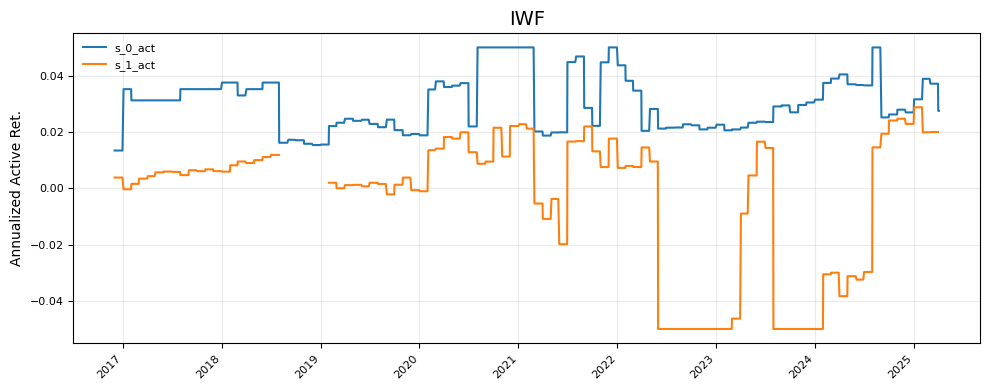

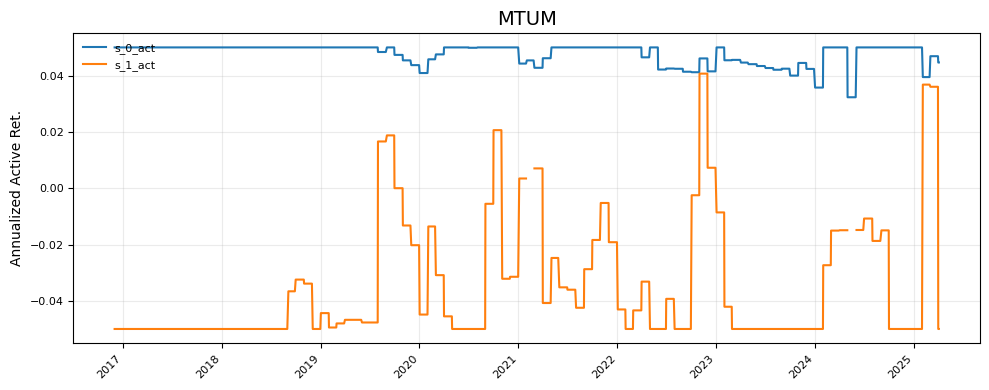

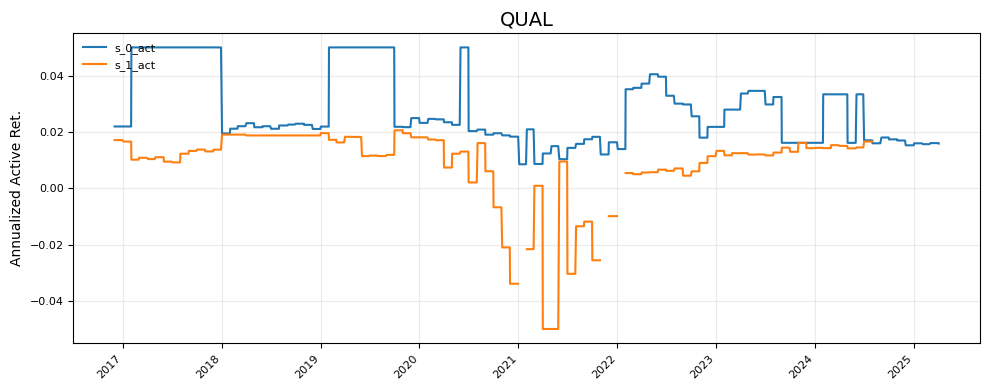

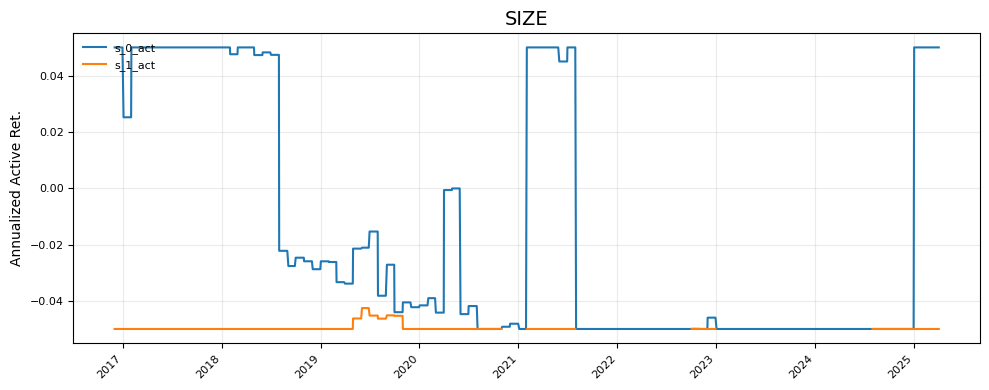

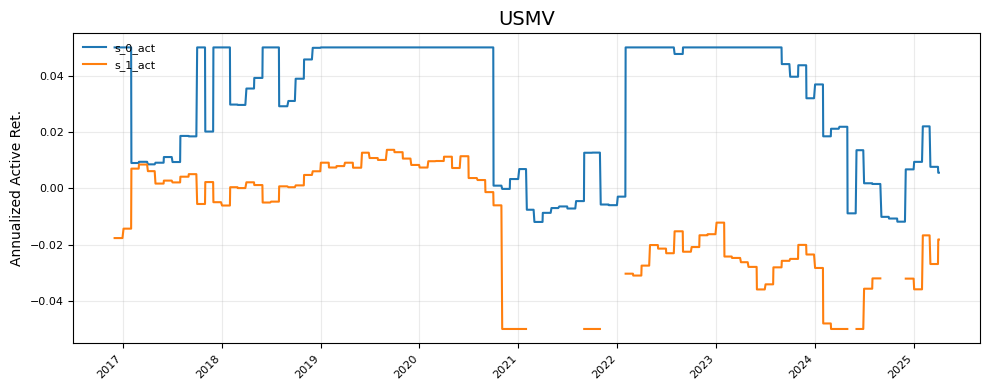

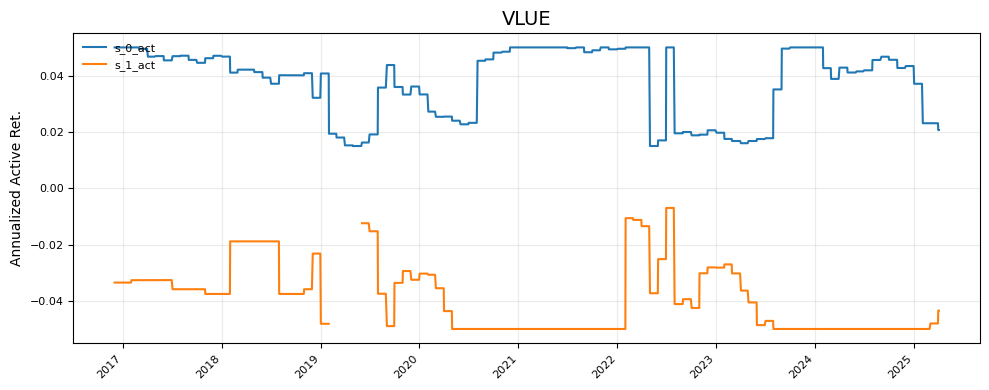

In [12]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ─── One-by-one plots of s_0_act and s_1_act with dynamic y-limits and smaller fonts ─────

for fac, df in factor_views.items():
    fig, ax = plt.subplots(figsize=(10, 4))

    # 1) Compute dynamic y-limits with a 5% margin over both series
    combined = pd.concat([df['s_0_act'], df['s_1_act']])
    min_val = combined.min()
    max_val = combined.max()
    # if constant, give a tiny absolute margin
    span = max_val - min_val if max_val > min_val else abs(min_val) or 1e-3
    margin = span * 0.05
    ax.set_ylim(min_val - margin, max_val + margin)

    # 2) Plot the two regime returns, breaking the line at NaNs
    ax.plot(df.index, df['s_0_act'], color='tab:blue',   lw=1.5, label='s_0_act')
    ax.plot(df.index, df['s_1_act'], color='tab:orange', lw=1.5, label='s_1_act')

    # 3) Title & grid
    ax.set_title(fac.upper(), fontsize=14)
    ax.grid(alpha=0.25)

    # 4) X-axis formatting
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    for lbl in ax.get_xticklabels():
        lbl.set_rotation(45)
        lbl.set_ha('right')
        lbl.set_fontsize(8)

    # 5) Y-axis tick labels
    for lbl in ax.get_yticklabels():
        lbl.set_fontsize(8)
    ax.set_ylabel('Annualized Active Ret.', fontsize=10)
    ax.yaxis.label.set_fontsize(10)

    # 6) Legend with smaller font
    ax.legend(frameon=False, loc='upper left', fontsize=8)

    fig.tight_layout()
    plt.show()


In [13]:
# ------------------------------------------------------------
# 2  BUILD & CACHE FACTOR‑VIEWS  for risk off
# ------------------------------------------------------------
VIEWS_FILE2 = "bayes_factor_views_v2_2014.pkl" # "SAVEfactor_views.pkl" is the views for the outperforming sharpe run
FORCE_REBUILD = False 

def _fit_one_factor(fac, refit_date, test_dates_chunk,
                    factor_data_dict, hyperparams,
                    min_years, max_years, init_start):

    # ---------- helpers ----------
    def get_train_window(current_date, full_data):
        train_end  = current_date
        train_start= max(train_end - pd.DateOffset(years=max_years),
                         pd.to_datetime(init_start))
        if (train_end - train_start) < pd.Timedelta(days=365.25*min_years):
            train_start = train_end - pd.DateOffset(years=min_years)
        idx = full_data.index
        subset = idx[(idx >= train_start) & (idx <= train_end)]
        start_date, end_date = subset.min(), subset.max()
        return start_date, end_date 

    # ---------- data ----------
    fac_data = factor_data_dict[fac]
    X   = fac_data["X"]
    ret = fac_data["fac_ret"]
    act = fac_data["active_ret"]

    lam = hyperparams["new_lambda"]
    kp  = hyperparams["new_kappa"]
    train_start, train_end = get_train_window(refit_date, X)

    # ---------- preprocess ----------
    clipper = DataClipperStd(mul=3.0)
    scaler  = StandardScaler()
    X_train = scaler.fit_transform(clipper.fit_transform(
                 filter_date_range(X, train_start, train_end)))
    active_train = filter_date_range(act, train_start, train_end)

    # ---------- fit SJM ----------
    sjm = SparseJumpModel(n_components=2,
                          max_feats=int(kp**2),
                          jump_penalty=lam)
    
    train_idx = filter_date_range(X, train_start, train_end).index
    X_train_df = pd.DataFrame(X_train, index=train_idx, columns=X.columns)
    sjm.fit(X_train_df, ret_ser=active_train, sort_by="cumret")

    ret_train = filter_date_range(ret, train_start, train_end)

    # regime‑level abs returns
    train_states = sjm.predict(X_train_df)
    abs_ret = {}
    for st in range(2):
        st_idx = (train_states==st)
        abs_ret[st] = ret_train.loc[st_idx].mean() * 252

    # ---------- online prediction for test dates ----------
    states = {}
    for day in test_dates_chunk:
        X_hist = X.loc[:day]                          # all history up to 'day'
        temp_clipper = DataClipperStd(mul=3.0)
        X_hist_clip  = temp_clipper.fit_transform(X_hist)

        temp_scaler  = StandardScaler()
        _ = temp_scaler.fit_transform(X_hist_clip)    # fit on *all* history

        if day in X.index:
            X_day_clip   = temp_clipper.transform(X.loc[[day]])
            X_day_scaled = temp_scaler.transform(X_day_clip)
            states[day]  = sjm.predict_online(
                pd.DataFrame(X_day_scaled,
                            index=[day],
                            columns=X.columns)).iloc[0]

    # assemble mini‑df for this factor & period
    out = pd.DataFrame({"state": pd.Series(states)},
                       index=list(states.keys()))
    out["ann_abs_ret"] = out["state"].map(abs_ret)
    return fac, out

def build_factor_views(factor_data_dict, saved_hyperparams, factors,
                       test_index,
                       refit_freq="ME", min_years=8, max_years=12,
                       init_start="2002-05-31"):

    views = {f:[] for f in factors}
    refit_dates = (test_index.to_series()
                   .resample(refit_freq)
                   .last()
                   .dropna())

    for j, refit_date in enumerate(refit_dates):
        if j < len(refit_dates)-1:
            next_refit = refit_dates.iloc[j+1]
        else:
            next_refit = test_index[-1]
        test_mask = (test_index>refit_date)&(test_index<=next_refit)
        test_chunk = test_index[test_mask]

        # ---- parallel over factors ----
        jobs = []
        for fac in factors:
            # latest hyperparams before refit_date
            hp_hist = [h for h in saved_hyperparams[fac]
                       if pd.to_datetime(h["date"])<=refit_date]
            if not hp_hist: continue
            hp = hp_hist[-1]
            jobs.append(delayed(_fit_one_factor)(
                fac, refit_date, test_chunk,
                factor_data_dict, hp,
                min_years, max_years, init_start))
        for fac, df in Parallel(n_jobs=-1)(jobs):
            views[fac].append(df)

    # concat & tidy
    for fac in factors:
        views[fac] = (pd.concat(views[fac])
                      .sort_index()
                      .loc[:,["state","ann_abs_ret"]])
    return views


# --------- build or load ----------         
if FORCE_REBUILD or not os.path.exists(VIEWS_FILE2):
    factor_views_risk_off = build_factor_views(factor_data_dict, saved_hyperparams, factors, 
                                      test_index,
                                      refit_freq=REFIT_FREQ, 
                                      min_years=8, max_years=12, init_start="2002-05-31")
    with open(VIEWS_FILE2, "wb") as f:
        pickle.dump(factor_views_risk_off, f)
else:
    with open(VIEWS_FILE2, "rb") as f:
        factor_views_risk_off = pickle.load(f)



In [14]:
# ------------------------------------------------------------
# 2  FAST BLACK‑LITTERMAN FUNCTION  (run as often as you like)
# ------------------------------------------------------------
from pypfopt import EfficientFrontier
from pypfopt.exceptions import OptimizationError

def ewm_covariance(returns, halflife=126, min_periods=60):
    ewm_cov = returns.ewm(halflife=halflife,
                          adjust=False,
                          min_periods=min_periods).cov()
    if returns.empty: return pd.DataFrame()
    return ewm_cov.loc[returns.index[-1]]

def detect_state_shifts(views, factors):
    # 1 col per factor with the model‑state
    state_df = pd.concat({f: views[f]["state"] for f in factors}, axis=1)
    # True when *any* factor changes state vs. the day before
    return state_df.ne(state_df.shift()).any(axis=1)

# ---------- helper: dict -> (P,Q) for relative views ----------
def make_relative_views(view_dict, assets, benchmark="Market"):
    """
    Convert {'fac': active_ret, ...} into (P,Q) so that
    E[fac] - E[benchmark] = active_ret  for every factor.
    """
    if benchmark not in assets:
        raise ValueError(f"Benchmark {benchmark!r} not in trade universe")

    n = len(assets)
    k = len(view_dict)
    P = np.zeros((k, n))
    Q = np.zeros(k)

    for i, (fac, v) in enumerate(view_dict.items()):
        if fac not in assets:
            continue                      # ignore missing factors
        P[i, assets.index(fac)]       = 1
        P[i, assets.index(benchmark)] = -1
        Q[i] = v                       # the expected active return
    return P, Q


def bl_max_sharpe_te(cov_hist, pi, views, tau, delta,
                     w_bmk, te_target, bounds, rf,
                     use_bl_cov=False):

    """
    Returns target weights *over trade_assets* (no cash leg).
    Falls back to the CVXPY excess-return solver if max_sharpe errors.
    """
    # 1) Black-Litterman → implied mu & Sigma
    P, Q = make_relative_views(views, list(w_bmk.index), benchmark="Market")
    bl = BlackLittermanModel(cov_hist, pi=pi, tau=tau,
                             delta=delta, P=P, Q=Q)
    Sigma = bl.bl_cov() if use_bl_cov else cov_hist
    mu    = bl.bl_returns()
    n     = len(mu)
    bmk_w = w_bmk.values
    Σ     = Sigma.values

    # 2) set up EF + TE + bounds
    ef = EfficientFrontier(mu, Sigma)
    ef.add_constraint(lambda w: cp.quad_form(w - bmk_w, Σ) <= te_target**2)
    # ef.add_constraint(lambda w: cp.norm1(w) <= 1) # for thew config when we dont want to lever with short proceeds
    # ef.add_constraint(lambda w: cp.sum(cp.pos((w))) <= 1) # or this one - not sure which is better
    for i, (lo, hi) in enumerate(bounds):
        ef.add_constraint(lambda w, i=i, lo=lo: w[i] >= lo)
        ef.add_constraint(lambda w, i=i, hi=hi: w[i] <= hi)

    # 3) try max_sharpe, else fallback to CVXPY
    try:
        raw_w = ef.max_sharpe(risk_free_rate=rf)
    except (OptimizationError, ValueError):
        w_var = cp.Variable(n)
        w_act = w_var - bmk_w
        prob = cp.Problem(
            cp.Maximize((mu.values - rf) @ w_var),
            [
                cp.sum(w_var) == 1,                                         # change to 'cp.norm1(w_var) <= 1' or 'cp.sum(cp.pos(w_var)) <= 1' when we dont want to lever with short proceeds
                w_var >= np.array([lo for lo, hi in bounds]),
                w_var <= np.array([hi for lo, hi in bounds]),
                cp.quad_form(w_act, Σ) <= te_target**2
            ]
        )
        prob.solve(solver="SCS")
        raw_w = dict(zip(w_bmk.index, w_var.value))

    return pd.Series(raw_w, index=w_bmk.index)


def run_bl_with_drift(views, returns_df, full_df, riskoff_views,
                      shift_series=None,
                      tau=0.05, delta=2.5,
                      te_target=0.05,
                      trade_market=True,
                      use_bl_cov=False,
                      allow_market_short=False,
                      allow_factor_short=False,
                      use_bl_prior=False,
                      fallback_strategy="HOLD_RFR",
                      tcost=0.0007,
                      initial_capital=1_000_000,
                      shifts = 0):
    """
    Returns:
      w_view   -> DataFrame of *target* weights from the optimizer
      w_actual -> DataFrame of *actual* daily weights, drifting unless rebalance
      rets     -> Series of daily portfolio returns (in decimal, e.g. 0.01 = 1%)
    """

    views = {fac: df.shift(shifts) for fac, df in views.items()}
    assets  = returns_df.columns.tolist()
    factors = list(views.keys())

    # ——————————————
    #  Per‐factor regime‐shift flags
    state_df = pd.concat({f: views[f]["state"] for f in factors}, axis=1)
    per_factor_shifts = (
        state_df.ne(state_df.shift())            # True where each factor flips
        .reindex(returns_df.index, fill_value=False)
    )
    per_factor_shifts.iloc[0, :] = True         # force update on day 1

    # Initialize “last seen” active_ret for each factor
    prev_active_ret = {
        fac: views[fac].loc[returns_df.index[0], "active_ret"]
        for fac in factors
    }
    # ——————————————


    # Decide which assets can be traded
    if trade_market:
        trade_assets = [a for a in assets if a != "rf"]
    else:
        trade_assets = [a for a in assets if a not in {"rf", "Market"}]

    cash_asset = "rf"

    # Bounds
    bounds = []
    for a in trade_assets:
        if a == "Market":
            bounds.append((-.3, .3) if allow_market_short else (0, 0.3))
        else:
            bounds.append((-.3, .3) if allow_factor_short else (0, 0.3))

    # Prepare DataFrames
    w_view   = pd.DataFrame(0.0, index=returns_df.index, columns=trade_assets + [cash_asset], dtype=float)
    w_actual = pd.DataFrame(0.0, index=returns_df.index, columns=trade_assets + [cash_asset], dtype=float)

    # Track positions in “dollar” terms
    positions = pd.Series(0.0, index=trade_assets + [cash_asset])
    capital   = initial_capital

    # Series of daily returns, e.g. +0.005 = +0.5%
    rets = pd.Series(0.0, index=returns_df.index)

    for i, t in enumerate(returns_df.index):
        old_capital = capital  # Store capital before today’s returns
        yesterday = t - pd.Timedelta(days=1)
        if fallback_strategy=="HOLD_RFR" and yesterday in rf_dates:
            # force 100% cash today, skip the rest
            w_view.loc[t, trade_assets] = 0.0
            w_view.loc[t, cash_asset]   = 1.0
            positions = capital * w_view.loc[t]
            w_actual.loc[t] = positions / capital
            rets.loc[t]     = 0.0  # or whatever you want on an rf_date
            continue

        # 1) Realize today's P&L from yesterday’s positions
        if i > 0:
            day_ret = returns_df.loc[t, trade_assets + [cash_asset]]
            daily_pnl = (positions[trade_assets] * day_ret[trade_assets]).sum() \
                        + positions[cash_asset] * day_ret[cash_asset]
            
            # short borrow cost
            short_dollar = positions[trade_assets].clip(upper=0).abs().sum()
            # borrw_r_daily     = returns_df.loc[t, "rf"]
            borrw_r_daily = .004 / 360 # 0.4% APR is median across the ETFs
            borrow_cost  = short_dollar * borrw_r_daily

            # net P&L = gross pnl minus borrow
            net_pnl     = daily_pnl - borrow_cost
            capital    += net_pnl

            # record net return
            rets.loc[t] = net_pnl / old_capital


        # 2) Decide if we rebalance today
        do_rebalance = False
        if i == 0:
            do_rebalance = True
        elif shift_series is not None and shift_series.loc[t]:
            do_rebalance = True

        # 3) If rebalancing, solve for new “view” weights
        if do_rebalance:
            hist = full_df[trade_assets].loc[:t].iloc[:-1]
            cov  = ewm_covariance(hist) * 252

            if cov.empty or cov.isna().any().any():
                w_view.loc[t, trade_assets] = 0.0
                w_view.loc[t, cash_asset]   = 1.0  # 100% cash
            else:
                # Build a quick "light" BlackLittermanModel
                if use_bl_prior:
                    market_caps  = {etf: 1.0 for etf in trade_assets}
                    prior_for_bl = market_implied_prior_returns(market_caps, delta, cov)
                else:
                    prior_for_bl = "equal"

                q = {}
                for fac in factors:
                    if per_factor_shifts.loc[t, fac]:
                        q_val = views[fac].loc[t, "active_ret"]
                    else:
                        q_val = prev_active_ret[fac]
                    q[fac] = q_val
                    prev_active_ret[fac] = q_val
                rf_annual = returns_df.loc[t, cash_asset] * 252

                # Build a quick "light" BlackLittermanModel
                q_abs = {fac: riskoff_views[fac].loc[t, "ann_abs_ret"] for fac in factors}

                bl0 = BlackLittermanModel(
                    cov,
                    pi=prior_for_bl,
                    tau=tau,
                    delta=delta,
                    absolute_views=q_abs
)


                # 2) Check fallback if all implied returns ≤ rf
                if (
                    fallback_strategy != "NO_FALLBACK"
                    and (bl0.bl_returns() <= rf_annual).all()
                ):
                    # “Risk-off” scenario
                    w_view.loc[t, trade_assets] = 0.0  # all 0
                    if fallback_strategy == "HOLD_RFR":
                        w_view.loc[t, cash_asset] = 1.0  # 100% in cash
                    elif fallback_strategy == "SHORT_MARKET" and "Market" in trade_assets:
                        w_view.loc[t, "Market"]   = -1.0
                        w_view.loc[t, cash_asset] = 1.0
                    # skip the main BL max-sharpe
                else:
                    # normal BL
                    w_opt = bl_max_sharpe_te(
                        cov,
                        pi=prior_for_bl,
                        views=q,
                        tau=tau,
                        delta=delta,
                        w_bmk=pd.Series(1 / len(trade_assets), index=trade_assets),
                        te_target=te_target,
                        bounds=bounds,
                        rf=rf_annual,
                        use_bl_cov=use_bl_cov
                    )
                    w_view.loc[t, trade_assets] = w_opt
                    w_view.loc[t, cash_asset]   = 1 - w_opt.sum()

                # 2) Check fallback if all implied returns ≤ rf
                # if t in rf_dates and fallback_strategy == "HOLD_RFR":
                #     # hold 100% in cash
                #     w_view.loc[t, trade_assets] = 0.0
                #     w_view.loc[t, cash_asset]    = 1.0
                # else:
                #     # normal BL
                #     w_opt = bl_max_sharpe_te(
                #         cov,
                #         pi=prior_for_bl,
                #         views=q,
                #         tau=tau,
                #         delta=delta,
                #         w_bmk=pd.Series(1 / len(trade_assets), index=trade_assets),
                #         te_target=te_target,
                #         bounds=bounds,
                #         rf=rf_annual,
                #         use_bl_cov=use_bl_cov
                #     )
                #     w_view.loc[t, trade_assets] = w_opt
                #     w_view.loc[t, cash_asset]   = 1 - w_opt.sum()


            # 4) Convert new “view weights” → actual $ positions
            new_positions = capital * w_view.loc[t]

            # transaction cost
            if tcost > 0 and i > 0:
                asset_trades = (new_positions[trade_assets] - positions[trade_assets]).abs().sum()
                cost        = asset_trades * tcost
                capital    -= cost
                rets.loc[t] = (capital - old_capital) / old_capital

            positions = new_positions

        else:
            # Not rebalancing → copy forward yesterday’s “view” weights
            if i > 0:
                w_view.loc[t] = w_view.iloc[i - 1]

        # 5) Actual weights
        if capital > 0:
            w_actual.loc[t] = positions / capital
        else:
            w_actual.loc[t] = 0.0

    return w_view, w_actual, rets, shift_series


In [ ]:
# ------------------------------------------------------------
# 3  QUICK EXPERIMENTS
# ------------------------------------------------------------
def annualized_sharpe(r):          # helper
    return (r.mean() / r.std()) * np.sqrt(252)

def ann_turnover(w):
    daily_turn = w.diff().abs().sum(axis=1).mean()
    return daily_turn * 252

trading_lag = 2

test_df = full_df.loc[test_index]
shift_days = detect_state_shifts(factor_views, factors)
# trade on the day after the shift
shift_days = shift_days.shift(trading_lag).reindex(test_df.index, fill_value=False)
shift_days.iloc[0] = True

cfgs = [

     dict(label="Base model 4% TE",  tau=0.05, delta=2.5,shift_series=shift_days, trade_market=True,
         use_bl_cov=False, use_bl_prior=True, allow_market_short=False, allow_factor_short=False, te_target=0.04, fallback_strategy="NO_FALLBACK"),
     dict(label="Base model 3% TE",  tau=0.05, delta=2.5,shift_series=shift_days, trade_market=True,
         use_bl_cov=False, use_bl_prior=True, allow_market_short=False, allow_factor_short=False, te_target=0.03, fallback_strategy="NO_FALLBACK"),
     dict(label="Base model 2% TE",  tau=0.05, delta=2.5,shift_series=shift_days, trade_market=True,
         use_bl_cov=False, use_bl_prior=True, allow_market_short=False, allow_factor_short=False, te_target=0.02, fallback_strategy="NO_FALLBACK"),
    dict(label="Base model 1% TE",  tau=0.05, delta=2.5,shift_series=shift_days, trade_market=True,
         use_bl_cov=False, use_bl_prior=True, allow_market_short=False, allow_factor_short=False, te_target=0.01, fallback_strategy="NO_FALLBACK"),    

     dict(label="L/S 4% TE",  tau=0.05, delta=2.5,shift_series=shift_days, trade_market=True,
         use_bl_cov=False, use_bl_prior=True, allow_market_short=True, allow_factor_short=True, te_target=0.04, fallback_strategy="NO_FALLBACK"),
     dict(label="L/S 3% TE",  tau=0.05, delta=2.5,shift_series=shift_days, trade_market=True,
         use_bl_cov=False, use_bl_prior=True, allow_market_short=True, allow_factor_short=True, te_target=0.03, fallback_strategy="NO_FALLBACK"),
     dict(label="L/S 2% TE",  tau=0.05, delta=2.5,shift_series=shift_days, trade_market=True,
         use_bl_cov=False, use_bl_prior=True, allow_market_short=True, allow_factor_short=True, te_target=0.02, fallback_strategy="NO_FALLBACK"),
    dict(label="L/S 1% TE",  tau=0.05, delta=2.5,shift_series=shift_days, trade_market=True,
         use_bl_cov=False, use_bl_prior=True, allow_market_short=True, allow_factor_short=True, te_target=0.01, fallback_strategy="NO_FALLBACK"),      


     dict(label="Risk-off 4% TE",  tau=0.05, delta=2.5,shift_series=shift_days, trade_market=True,
         use_bl_cov=False, use_bl_prior=True, allow_market_short=False, allow_factor_short=False, te_target=0.04, fallback_strategy="HOLD_RFR"),
     dict(label="Risk-off 3% TE",  tau=0.05, delta=2.5,shift_series=shift_days, trade_market=True,
         use_bl_cov=False, use_bl_prior=True, allow_market_short=False, allow_factor_short=False, te_target=0.03, fallback_strategy="HOLD_RFR"),
     dict(label="Risk-off 2% TE",  tau=0.05, delta=2.5,shift_series=shift_days, trade_market=True,
         use_bl_cov=False, use_bl_prior=True, allow_market_short=False, allow_factor_short=False, te_target=0.02, fallback_strategy="HOLD_RFR"),
    dict(label="Risk-off 1% TE",  tau=0.05, delta=2.5,shift_series=shift_days, trade_market=True, 
         use_bl_cov=False, use_bl_prior=True, allow_market_short=False, allow_factor_short=False, te_target=0.01, fallback_strategy="HOLD_RFR"),

]


run_results = {}
for c in cfgs:
    label = c.pop("label")
    w_view, w_act, daily_returns, flags = run_bl_with_drift(
        factor_views,  # factor views
        test_df,       # returns_df
        full_df,       # full_df
        riskoff_views=factor_views_risk_off,
        shifts=trading_lag,
        **c
    )
    
    run_results[label] = {
        "returns":        daily_returns,  # decimal daily returns
        "weights_view":   w_view,
        "weights_actual": w_act,
        "trade_flags":    flags,
        "cfg":            c
    }




In [15]:
import pickle

# # # # # # 1) SAVE # # # # # # 

# with open("run_results_lag2.pkl", "wb") as f:   #run_results_crossval30bps20-1000_efsolver uses max_sharpe with cvxpy solver fallback, run_results_base_shortcost_oldnames is just old names
#     pickle.dump(run_results, f)


# # # # # # 1) LOAD # # # # # # 

with open("run_results_lag2.pkl", "rb") as f:
    run_results = pickle.load(f)

test_df = full_df.loc[test_index]


In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ipywidgets import SelectMultiple, Dropdown, ToggleButtons, VBox, HBox, interact

import importlib, jumpmodels.plot as jmplot
importlib.reload(jmplot)
from jumpmodels.plot import plot_cumret_compounded

# === Cleaner labels ===
strategy_labels = {
    "Benchmark (Q-Rebalanced EW)": "Benchmark (Q-Rebalanced EW)",
    "Benchmark (Market Buy-Hold)": "Benchmark (Market Buy-Hold)",
    "Base model 1% TE": "Long-Only (1 per cent TE)",
    "Base model 2% TE": "Long-Only (2 per cent TE)",
    "Base model 3% TE": "Long-Only (3 per cent TE)",
    "Base model 4% TE": "Long-Only (4 per cent TE)",
    "L/S 1% TE": "Long-Short (1 per cent TE)",
    "L/S 2% TE": "Long-Short (2 per cent TE)",
    "L/S 3% TE": "Long-Short (3 per cent TE)",
    "L/S 4% TE": "Long-Short (4 per cent TE)",
    "Risk-off 1% TE": "Long-Only with Risk-Off (1 per cent TE)",
    "Risk-off 2% TE": "Long-Only with Risk-Off (2 per cent TE)",
    "Risk-off 3% TE": "Long-Only with Risk-Off (3 per cent TE)",
    "Risk-off 4% TE": "Long-Only with Risk-Off (4 per cent TE)",
}

run_results = {
    strategy_labels.get(orig, orig): vals
    for orig, vals in run_results.items()
}

factor_labels = {
    "iwf":  "IWF (Growth factor)",
    "mtum": "MTUM (Momentum factor)",
    "qual": "QUAL (Quality factor)",
    "size": "SIZE (Size factor)",
    "usmv": "USMV (Low-volatility factor)",
    "vlue": "VLUE (Value factor)",
    "Market": "Market",
    "rf":     "Risk-free"
}


full_idx = test_index

# --------------------------------------------------------------------
# 1) Clean out old EW from run_results
# --------------------------------------------------------------------
for k in list(run_results):
    if k.startswith("Benchmark (Q-Rebalanced EW)"):
        run_results.pop(k)

# --------------------------------------------------------------------
# 2) Rebuild the EW benchmark for your test set
# --------------------------------------------------------------------
TCOST = 0.0007                               # one-way cost, 70 bp
df     = etf_df.loc[test_index.intersection(etf_df.index)].drop(columns=["rf"])
n      = df.shape[1]

# Quarter-end boundaries
first  = df.index[0]
qends  = df.index.to_series().resample("QE").last().dropna().index
if first not in qends:
    qends = qends.insert(0, first)

# Containers
ew_view   = pd.DataFrame(index=df.index, columns=df.columns, dtype=float)   # always 1/n
ew_actual = pd.DataFrame(index=df.index, columns=df.columns, dtype=float)   # drifts between rebalances
ew_rets   = pd.Series(index=df.index, dtype=float)

prev_w     = np.zeros(n)       # weights at close of previous day
trade_days = []                # store the actual rebalance dates

# ----- simulate -----------------------------------------------------
for i in range(len(qends) - 1):
    start, end = qends[i], qends[i + 1]
    period = df.loc[(df.index > start) & (df.index <= end)]
    if period.empty:
        continue

    # (A) Rebalance on the first business day after the quarter-end
    first_day = period.index[0]
    w_target  = np.ones(n) / n                       # equal-weight target
    tc        = TCOST * np.abs(w_target - prev_w).sum()
    r0        = df.loc[first_day].values
    ew_rets.loc[first_day] = w_target.dot(r0) - tc

    ew_view.loc[first_day]   = w_target
    ew_actual.loc[first_day] = w_target
    trade_days.append(first_day)

    w = w_target.copy()                              # start drift from target

    # (B) Remaining days in the quarter: drift only
    for day in period.index[1:]:
        r_i = df.loc[day].values
        w   = w * (1 + r_i)                          # price drift intraday
        w  /= w.sum()                                # keep fully invested

        ew_view.loc[day]   = w_target                # still 1/n target
        ew_actual.loc[day] = w                       # drifted actual
        ew_rets.loc[day]   = w.dot(r_i)

    prev_w = w.copy()

# fill any gaps
ew_view   = ew_view.ffill().fillna(1 / n)
ew_actual = ew_actual.ffill().fillna(1 / n)
ew_rets   = ew_rets.fillna(0)

# Boolean mask: True on trade days
ew_flags = pd.Series(False, index=full_idx)
ew_flags.loc[[d for d in trade_days if d in ew_flags.index]] = True

# store in run_results
run_results["Benchmark (Q-Rebalanced EW)"] = {
    "returns":        ew_rets.reindex(full_idx).fillna(0),
    "weights_view":   ew_view.reindex(full_idx).ffill(),
    "weights_actual": ew_actual.reindex(full_idx).ffill(),
    "trade_flags":    ew_flags,
}

# --------------------------------------------------------------------
# 3) Add "Market Buy-Hold" benchmark
# --------------------------------------------------------------------
market_rets = etf_df["Market"].loc[test_index.intersection(etf_df.index)]
market_w    = pd.DataFrame(index=market_rets.index, columns=["Market"])
market_w["Market"] = 1.0

market_flags = pd.Series(False, index=full_idx)
market_flags.iloc[0] = True

run_results["Benchmark (Market Buy-Hold)"] = {
    "returns":        market_rets.reindex(full_idx).fillna(0),
    "weights_view":   market_w.reindex(full_idx).ffill().fillna(0),
    "weights_actual": market_w.reindex(full_idx).ffill().fillna(0),
    "trade_flags":    market_flags,          # ← add this
}

# --------------------------------------------------------------------
# 4) Reindex everything to the full test calendar
# --------------------------------------------------------------------


for lab, res in run_results.items():
    # Reindex returns
    res["returns"] = res["returns"].reindex(full_idx).fillna(0)
    
    # Reindex view + actual if present
    if "weights_view" in res:
        res["weights_view"] = res["weights_view"].reindex(full_idx).ffill().fillna(0)
    if "weights_actual" in res:
        res["weights_actual"] = res["weights_actual"].reindex(full_idx).ffill().fillna(0)


# --------------------------------------------------------------------
# 5) Build “active dates” if needed
# --------------------------------------------------------------------
active = pd.Index([])
for cfg in run_results.values():
    # For single-weights cases:
    wdf = cfg.get("weights")
    if wdf is not None:
        idx = wdf.drop(columns=["rf"], errors="ignore").dropna(how="all").index
        active = active.union(idx)
    # For drifting-weights cases:
    wv  = cfg.get("weights_view")
    wa  = cfg.get("weights_actual")
    if wv is not None:
        idx = wv.drop(columns=["rf"], errors="ignore").dropna(how="all").index
        active = active.union(idx)
    if wa is not None:
        idx = wa.drop(columns=["rf"], errors="ignore").dropna(how="all").index
        active = active.union(idx)

active = active.sort_values()
ew_w = ew_actual.loc[ew_actual.index.isin(active)]

# --------------------------------------------------------------------
# 6) Interactive widgets
# --------------------------------------------------------------------
labels = list(run_results.keys())

cmp = SelectMultiple(
    options=labels,
    value=tuple(labels[:2]) if len(labels) >= 2 else tuple(labels),
    description="Compare:",
    rows=min(8, len(labels)),
    style={"description_width": "70px"}
)
wgt = Dropdown(
    options=labels,
    value=labels[0],
    description="Weights:",
    style={"description_width": "70px"}
)
sign = ToggleButtons(
    options=[("Both", "both"), ("Positive", "pos"), ("Negative", "neg")],
    value="both",
    description="Show:",
    style={"description_width": "70px"}
)

def sharpe(returns):
    return returns.mean() / returns.std() * np.sqrt(252) if returns.std() != 0 else np.nan

def _update(compare, weights_cfg, sign_filter):
    if not compare:
        print("Pick ≥1 config.")
        return
    
    # 1) Always include benchmarks
    benchmarks = []
    for bench_name in ["Benchmark (Q-Rebalanced EW)", "Benchmark (Market Buy-Hold)"]:
        if bench_name in run_results:
            benchmarks.append(bench_name)

    # 2) Build dictionary
    data = {}
    for bmk in benchmarks:
        data[bmk] = run_results[bmk]["returns"]
    for lab in compare:
        data[lab] = run_results[lab]["returns"]

    ret_df = pd.DataFrame(data).reindex(full_idx, fill_value=0)

    # 3) Plot cumulative returns
    plot_cumret_compounded(ret_df)
    handles, labels = plt.gca().get_legend_handles_labels()
    labels = [lab.replace("%", "%%") for lab in labels]
    plt.legend(handles, labels)
    plt.grid(True)
    plt.show()


    # 4) Print Sharpe for all displayed
    # print("Annualised Sharpe ratios (incl. benchmarks):")
    # for col in ret_df.columns:
    #     sr = sharpe(ret_df[col])
    #     print(f"  {col:<45s}: {sr:.3f}")

    # 5) (Weights plotting stays unchanged)

    #    If run_results[weights_cfg] has separate 'weights_view' & 'weights_actual',
    #    do two separate stackplots: "View Weights" first, then "Actual Weights."
    res = run_results[weights_cfg]
    wv = res.get("weights_view")
    wa = res.get("weights_actual")

    # rename the columns so your legend shows e.g. "IWF (Growth factor)" instead of "iwf"
    wv = wv.rename(columns=factor_labels)
    wa = wa.rename(columns=factor_labels)


    if wv is not None and wa is not None:
        # Possibly filter positive/negative
        if sign_filter == "pos":
            wv = wv.where(wv > 0, 0)
            wa = wa.where(wa > 0, 0)
        elif sign_filter == "neg":
            wv = wv.where(wv < 0, 0)
            wa = wa.where(wa < 0, 0)


        # (A) View weights
        fig, ax = plt.subplots(figsize=(16, 6))
        ax.stackplot(wv.index, wv.T.values, labels=wv.columns)
        ax.set_ylabel("Weight", fontsize=30)
        ax.tick_params(axis='both', labelsize=30)

        # Move legend to the right
        leg = ax.legend(
            loc='center left',
            bbox_to_anchor=(1.02, 0.5),  # outside the plot to the right
            fontsize=12,
            frameon=True,
            fancybox=True
        )
        leg.get_frame().set_facecolor('white')
        leg.get_frame().set_edgecolor('black')
        leg.get_frame().set_alpha(0.8)

        plt.tight_layout()
        plt.show()

        # (B) Actual (drifted) weights
        fig, ax = plt.subplots(figsize=(16, 6))
        ax.stackplot(wa.index, wa.T.values, labels=wa.columns)
        ax.set_ylabel("Weight", fontsize=30)
        ax.tick_params(axis='both', labelsize=30)

        # Move legend to the right
        leg = ax.legend(
            loc='center left',
            bbox_to_anchor=(1.02, 0.5),
            fontsize=12,
            frameon=True,
            fancybox=True
        )
        leg.get_frame().set_facecolor('white')
        leg.get_frame().set_edgecolor('black')
        leg.get_frame().set_alpha(0.8)

        plt.tight_layout()
plt.show()


ui = VBox([HBox([cmp, wgt, sign])])
interact(_update, compare=cmp, weights_cfg=wgt, sign_filter=sign)


# --------------------------------------------------------------------
# 9) Final table with all your stats
# --------------------------------------------------------------------
def ann_return(r):
    total = (1 + r).prod()
    n = r.shape[0]
    return total**(252/n) - 1 if total>0 else np.nan

def ann_volatility(r):
    return r.std() * np.sqrt(252)

def max_drawdown(r):
    cum = (1 + r).cumprod()
    peak = cum.cummax()
    dd = cum / peak - 1
    return -dd.min()

def sortino(r, mar=0.0):
    downside = r[r < 0]
    if downside.empty:
        return np.nan
    downside_deviation = np.sqrt((downside ** 2).mean())
    return r.mean() / downside_deviation * np.sqrt(252) if downside_deviation > 0 else np.nan

def calmar(r):
    ar = ann_return(r)
    dd = max_drawdown(r)
    return ar / dd if dd>0 else np.nan

def information_ratio(series, bench):
    a, b = series.align(bench, join="inner")
    active = a - b
    return sharpe(active)

def total_turnover(weights):
    w = weights.ffill().fillna(0)
    daily_t = w.diff().abs().sum(axis=1)
    return daily_t.mean() * 252



def ann_turnover(weights, trade_flags=None):
    """
    One-way annual turnover.
    Parameters
    ----------
    weights : DataFrame  (actual or target)
    trade_flags : Series[bool]  True on real trade dates
    """
    w = weights.ffill().fillna(0)
    daily = 0.5 * w.diff().abs().sum(1)          # buys+sells each day
    if trade_flags is not None:
        daily = daily.where(trade_flags, 0)      # zero on no-trade days
    return daily.resample("YE").sum().mean()


# Build table
rf_daily = etf_df["rf"].reindex(full_idx).fillna(0)
rows = []
for lab, res in run_results.items():
    r = res["returns"]  # daily decimal returns
    r_ex = r - rf_daily
    wdf = res.get("weights_actual", res.get("weights_view", None))
    flags = res["trade_flags"]

    row = {}
    row["Strategy"] = lab
    row["Ann.Return"]   = ann_return(r)
    row["Ann.Ex.Return"]= ann_return(r_ex)
    row["Ann.Ex.Risk"]  = ann_volatility(r_ex)
    row["Ex.Sharpe"]    = sharpe(r_ex)
    row["MaxDD"]        = max_drawdown(r)
    row["Sortino"]      = sortino(r_ex)
    row["Calmar"]       = calmar(r)

    # info ratio vs. your Q-Rebalanced EW, if it’s in run_results
    if "Benchmark (Q-Rebalanced EW)" in run_results:
        row["InfoRatio"] = information_ratio(r, run_results["Benchmark (Q-Rebalanced EW)"]["returns"])
    else:
        row["InfoRatio"] = np.nan

    if wdf is not None:
        row["Turnover"] = ann_turnover(wdf, flags)
    else:
        row["Turnover"] = np.nan

    rows.append(row)

df_stats = pd.DataFrame(rows)
print(df_stats.to_string(index=False, float_format=lambda x: f"{x:.3f}"))




interactive(children=(SelectMultiple(description='Compare:', index=(0, 1), options=('Long-Only (4 per cent TE)…

                               Strategy  Ann.Return  Ann.Ex.Return  Ann.Ex.Risk  Ex.Sharpe  MaxDD  Sortino  Calmar  InfoRatio  Turnover
              Long-Only (4 per cent TE)       0.123          0.099        0.188      0.596  0.317    0.561   0.389      0.497     7.172
              Long-Only (3 per cent TE)       0.118          0.093        0.184      0.577  0.318    0.543   0.370      0.351     7.095
              Long-Only (2 per cent TE)       0.113          0.089        0.178      0.568  0.327    0.533   0.346      0.178     6.146
              Long-Only (1 per cent TE)       0.110          0.086        0.174      0.564  0.333    0.528   0.331      0.043     4.412
             Long-Short (4 per cent TE)       0.116          0.091        0.191      0.555  0.322    0.524   0.360      0.237     9.967
             Long-Short (3 per cent TE)       0.113          0.089        0.184      0.554  0.322    0.523   0.350      0.159     9.564
             Long-Short (2 per cent TE)       0.

In [ ]:
# import os

# # 1) make an output folder
# outdir = "weight_view_plots"
# os.makedirs(outdir, exist_ok=True)

# # 2) for each strategy, plot and save its view‐weights
# for strat, res in run_results.items():
#     wv = res.get("weights_view")
#     if wv is None:
#         continue

#     # rename for nicer legend
#     wv = wv.rename(columns=factor_labels)

#     # plot
#     fig, ax = plt.subplots(figsize=(16, 6))
#     ax.stackplot(wv.index, wv.T.values, labels=wv.columns)
#     ax.set_ylabel("Weight", fontsize=30)
#     ax.tick_params(axis='both', labelsize=30)
#     leg = ax.legend(
#         loc='center left', bbox_to_anchor=(1.02, 0.5),
#         fontsize=12, frameon=True, fancybox=True
#     )
#     leg.get_frame().set_facecolor('white')
#     leg.get_frame().set_edgecolor('black')
#     leg.get_frame().set_alpha(0.8)
#     plt.tight_layout()

#     # safe‐ify filename (no spaces/slashes/etc)
#     fn = strat.replace(" ", "_").replace("%", "pct").replace("/", "-")
#     path = os.path.join(outdir, f"{fn}.png")

#     # save and close
#     fig.savefig(path, dpi=150, bbox_inches="tight")
#     plt.close(fig)

# print(f"Saved {len(os.listdir(outdir))} plots to ./{outdir}/")


Saved 14 plots to ./weight_view_plots/


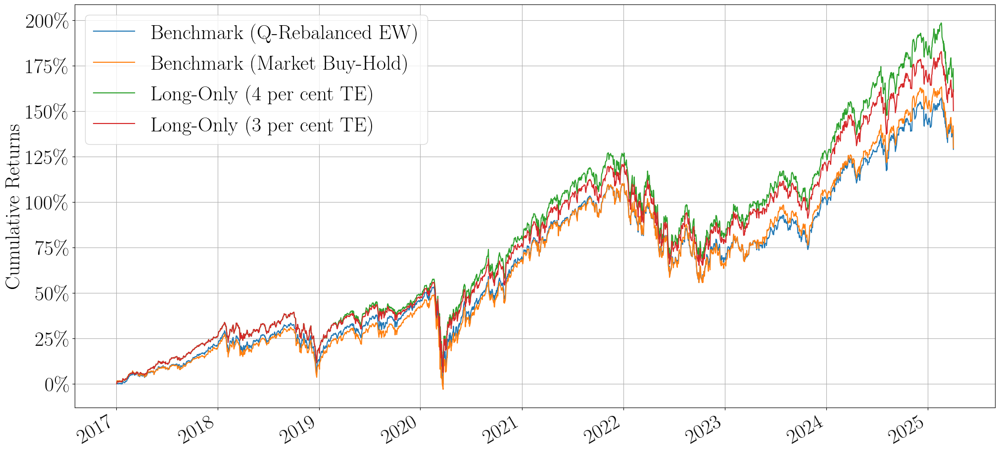

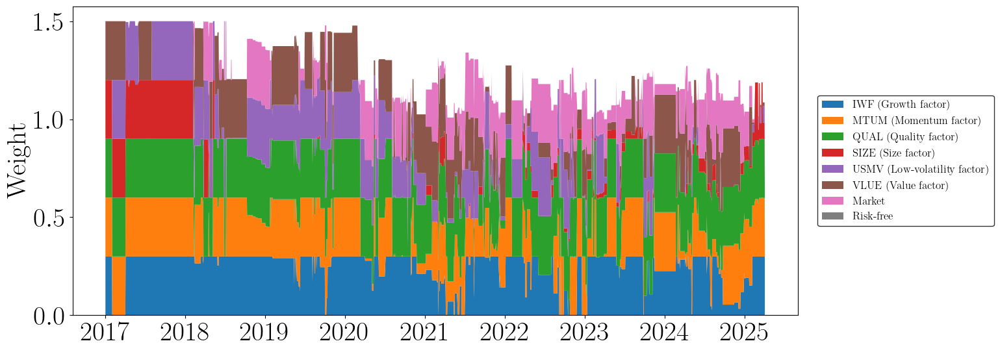

→ saved ls_view_weights\Long-Short_4_per_cent_TE_positive.png


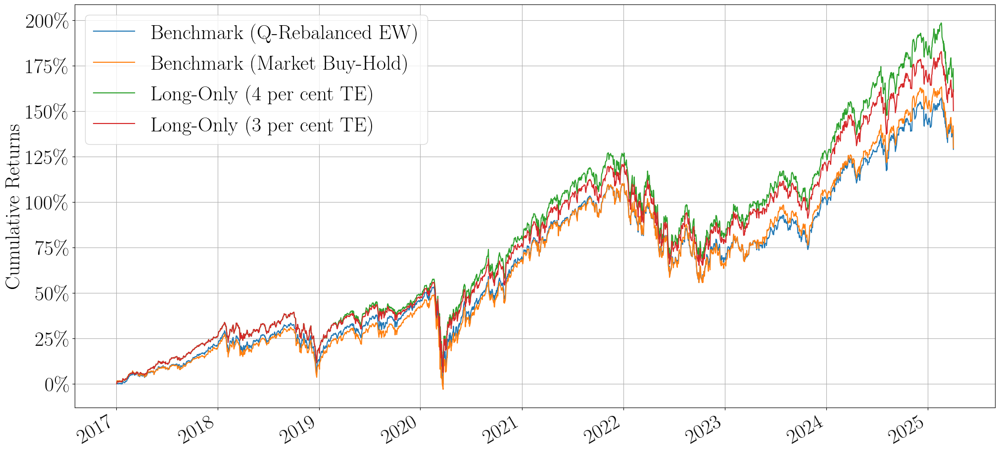

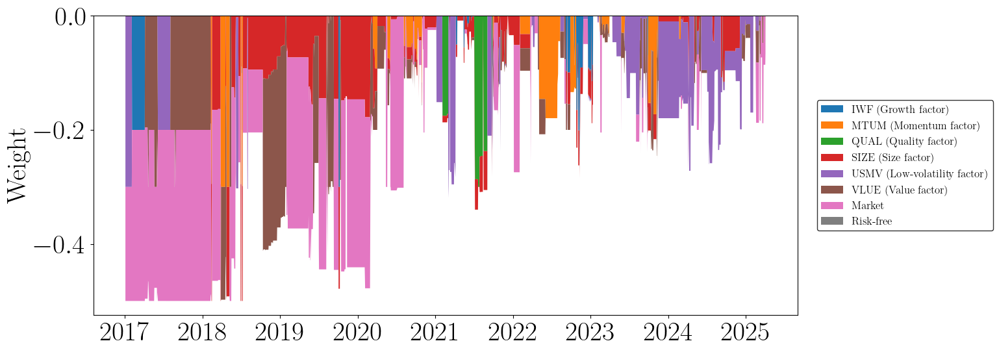

→ saved ls_view_weights\Long-Short_4_per_cent_TE_negative.png


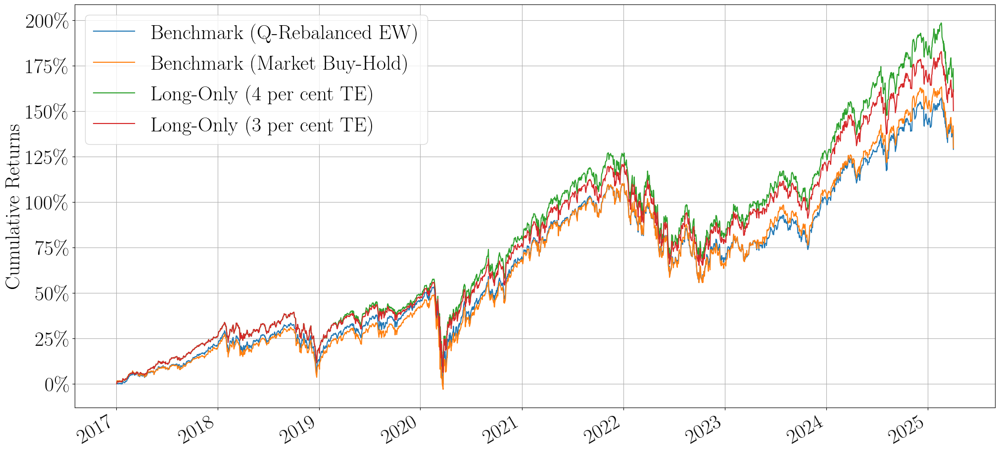

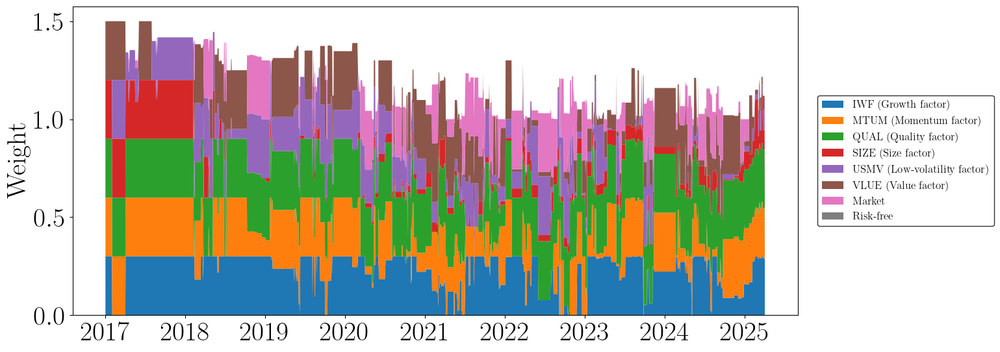

→ saved ls_view_weights\Long-Short_3_per_cent_TE_positive.png


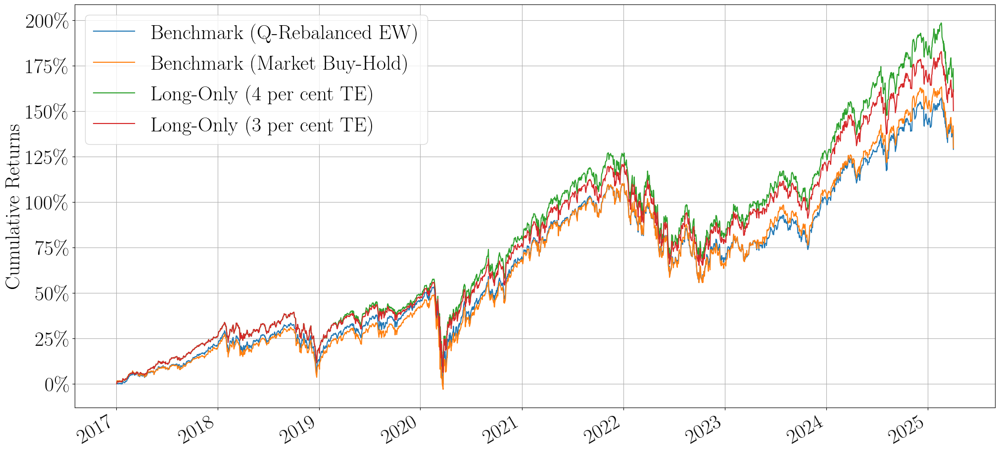

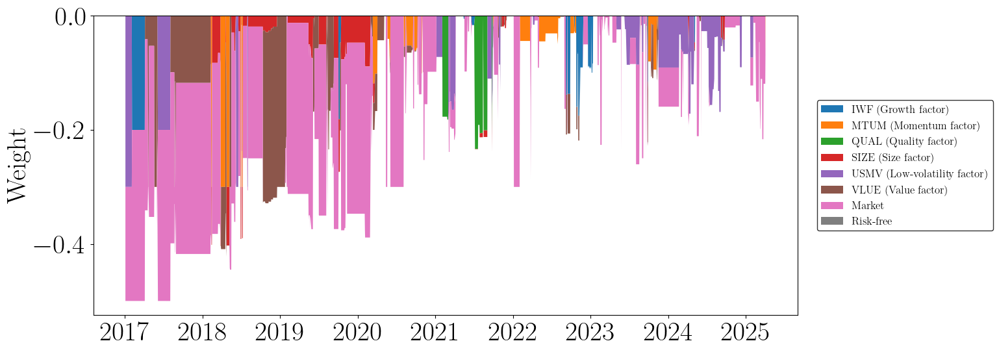

→ saved ls_view_weights\Long-Short_3_per_cent_TE_negative.png


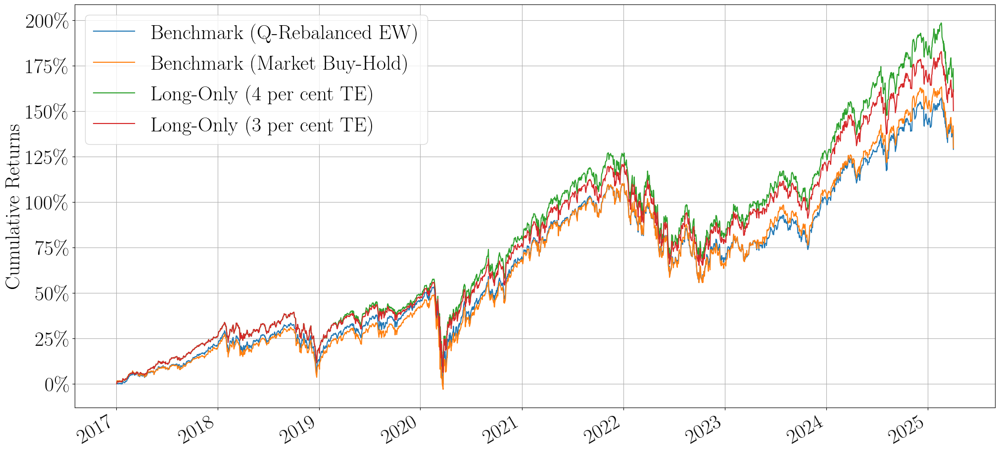

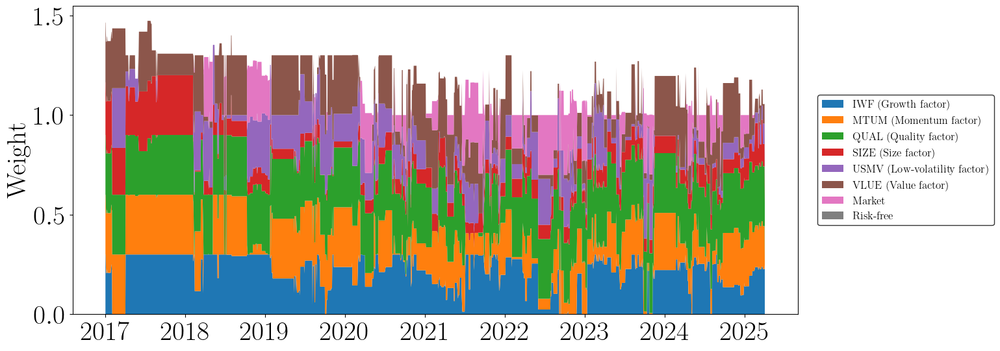

→ saved ls_view_weights\Long-Short_2_per_cent_TE_positive.png


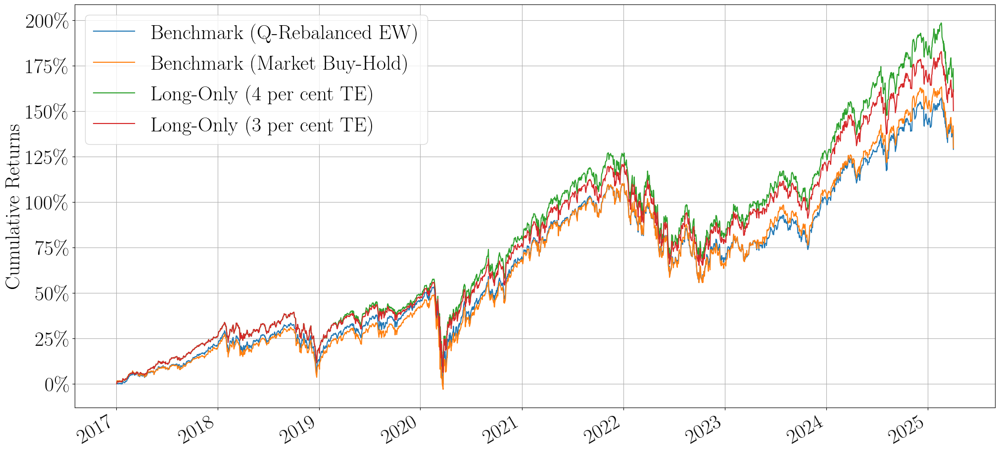

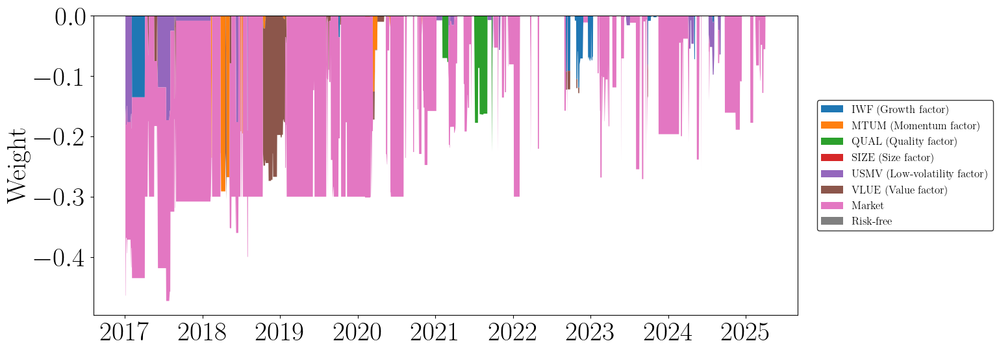

→ saved ls_view_weights\Long-Short_2_per_cent_TE_negative.png


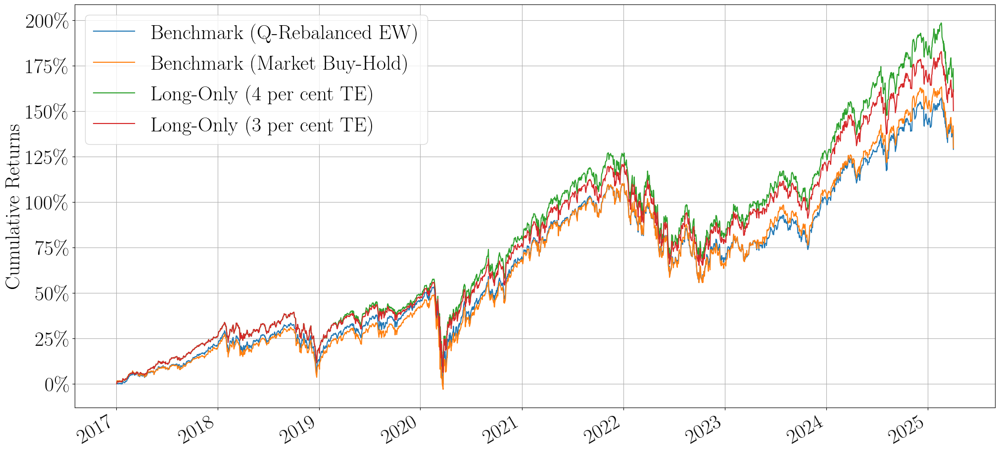

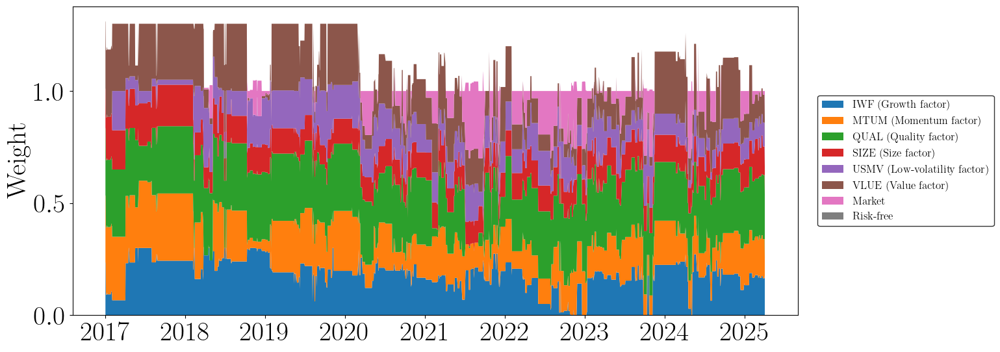

→ saved ls_view_weights\Long-Short_1_per_cent_TE_positive.png


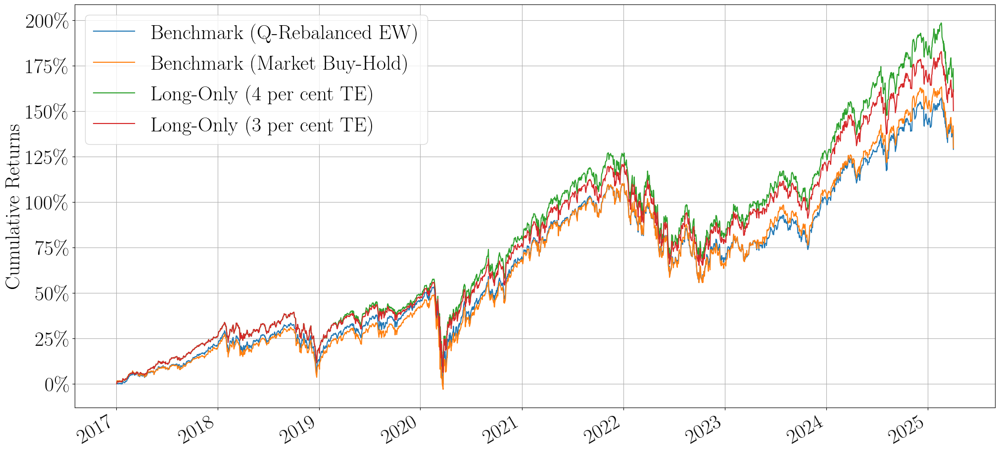

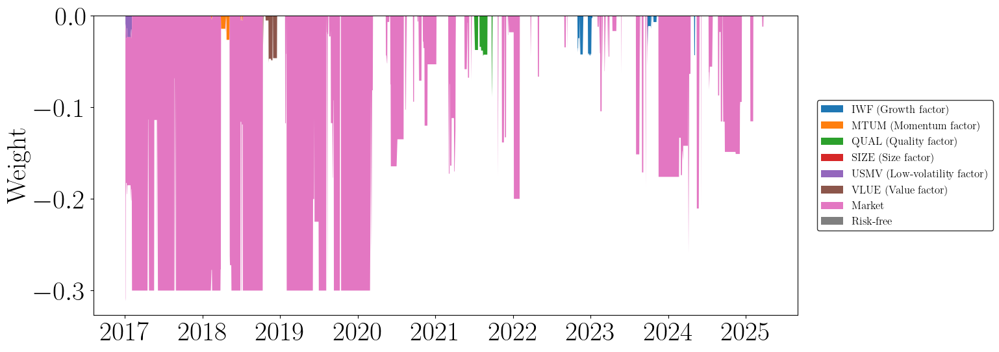

→ saved ls_view_weights\Long-Short_1_per_cent_TE_negative.png


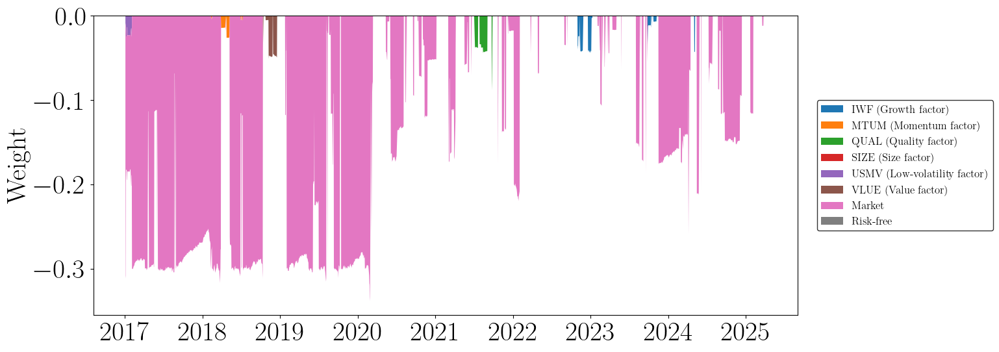

In [ ]:
# import os
# import matplotlib.pyplot as plt

# outdir = "ls_view_weights"
# os.makedirs(outdir, exist_ok=True)

# ls_strats = [
#     "Long-Short (4 per cent TE)",
#     "Long-Short (3 per cent TE)",
#     "Long-Short (2 per cent TE)",
#     "Long-Short (1 per cent TE)",
# ]

# for strat in ls_strats:
#     for sign, tag in [("pos", "positive"), ("neg", "negative")]:
#         # clear any prior figures
#         plt.close("all")

#         # call the plot routine
#         _update(
#             compare=list(cmp.value),
#             weights_cfg=strat,
#             sign_filter=sign
#         )

#         # the **first** new figure is the view-weights
#         figs = plt.get_fignums()
#         if not figs:
#             continue
#         fig = plt.figure(figs[0])

#         # sanitize filename
#         fn = (
#             strat
#             .replace(" ", "_")
#             .replace("(", "")
#             .replace(")", "")
#             .replace("%", "pct")
#             .replace("/", "-")
#         )
#         path = os.path.join(outdir, f"{fn}_{tag}.png")

#         fig.savefig(path, dpi=150, bbox_inches="tight")
#         print(f"→ saved {path}")


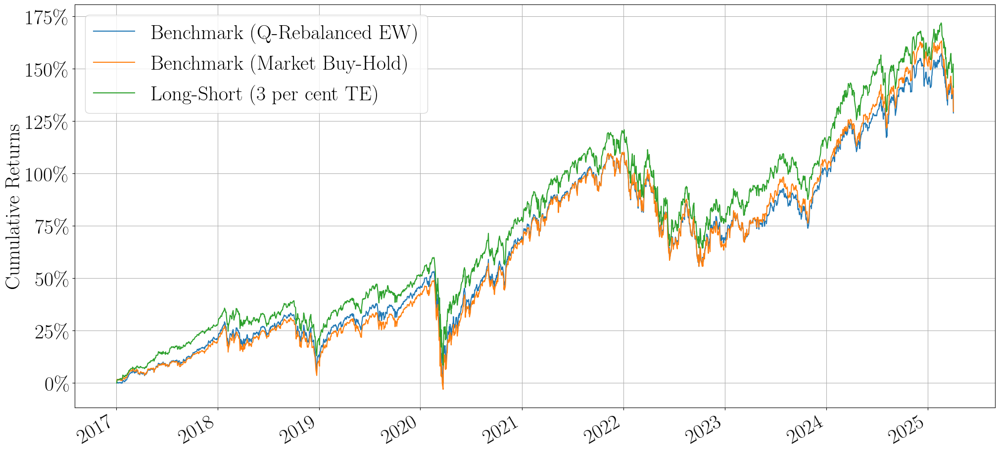

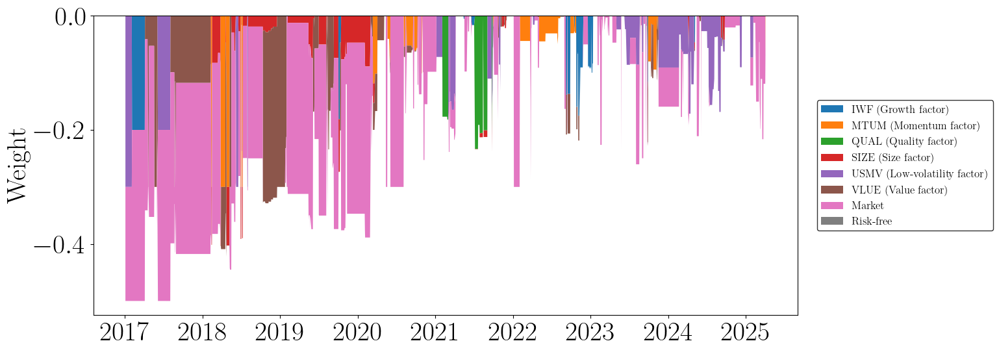

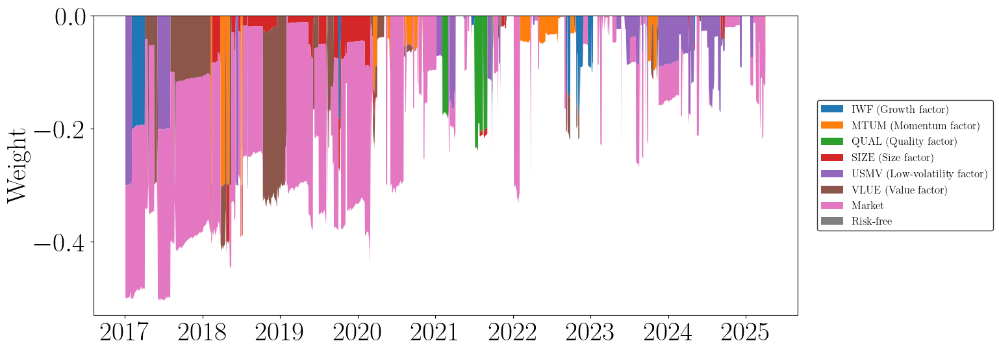

In [28]:
# Plots for save
_update(
    compare=list(cmp.value),      # the configs you ticked in “Compare”
    weights_cfg=wgt.value,        # the config chosen in “Weights”
    sign_filter=sign.value        # 'both' / 'pos' / 'neg' from the toggle
)

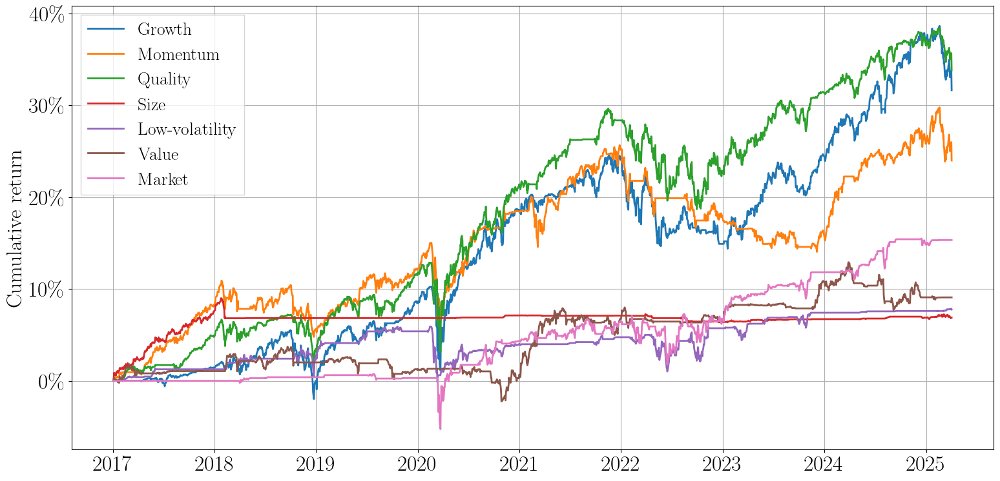

In [32]:
# Return contributions

import matplotlib.pyplot as plt
# import importlib, jumpmodels.plot as jmplot
# importlib.reload(jmplot)
from jumpmodels.plot import plot_cumret_compounded, check_axes
import re
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick


def plot_factor_contributions(strategy_name, run_results, returns_df, factor_labels):
    # get raw weights
    w_view = run_results[strategy_name]["weights_actual"]

    # decide which cols to drop
    exclude = set()
    if "Risk-Off" not in strategy_name:
        exclude |= {"rf"}

    # pick only remaining factor cols
    factor_cols = [
        c for c in w_view.columns
        if c in returns_df.columns and c not in exclude
    ]

    # slice returns & align weights
    r_df   = returns_df[factor_cols]
    w_view = w_view[factor_cols].reindex(r_df.index).ffill().fillna(0)

    # compute daily P&L contributions
    contrib          = w_view.shift(1).mul(r_df)
    contrib.iloc[0]  = 0.0

    # rename to full labels
    contrib = contrib.rename(columns=factor_labels)
    w_plot  = w_view.rename(columns=factor_labels)

    # 1) cumulative-return plot
    cumret = (1 + contrib).cumprod() - 1




    # Set up figure and axis
    fig, ax = plt.subplots(figsize=(16, 8))

    # Plot each column
    for col in cumret.columns:
        ax.plot(cumret.index, cumret[col], label=col, linewidth=2)

    # Legend, grid, labels, and styling
    handles, labels = ax.get_legend_handles_labels()
    new_labels = []
    for lab in labels:
        # 1) extract inside parentheses (if any), else use full label
        m = re.search(r"\(([^)]*)\)", lab)
        text = m.group(1) if m else lab
        # 2) remove the word "factor" (case-insensitive) and strip whitespace
        text = re.sub(r"\bfactor\b", "", text, flags=re.IGNORECASE).strip()
        new_labels.append(text)
    ax.legend(handles, new_labels,
          loc="upper left",
          fontsize=20,
          frameon=True,
          fancybox=False)
    ax.grid(True)
    ax.set_ylabel("Cumulative return", fontsize=24)
    ax.tick_params(axis='both', labelsize=24)
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
    
    fig.tight_layout()
    # fig.savefig("ret_contribution.png", dpi=300) 

    
    plt.show()

    # 2) weights stackplot
    # fig, ax = plt.subplots(figsize=(8, 6))
    # ax.stackplot(
    #     w_plot.index,
    #     *w_plot.values.T,
    #     labels=w_plot.columns
    # )
    # ax.set_ylabel("Weight", fontsize=30)
    # ax.tick_params(axis='both', labelsize=30)
    # ax.legend(loc="upper left")
    # plt.show()



# --- Example usage ---
# Just pick a strategy name from your `run_results` and call the function:
chosen_strategy = "Long-Only (4 per cent TE)"  # 
plot_factor_contributions(chosen_strategy, run_results, test_df, factor_labels)



    


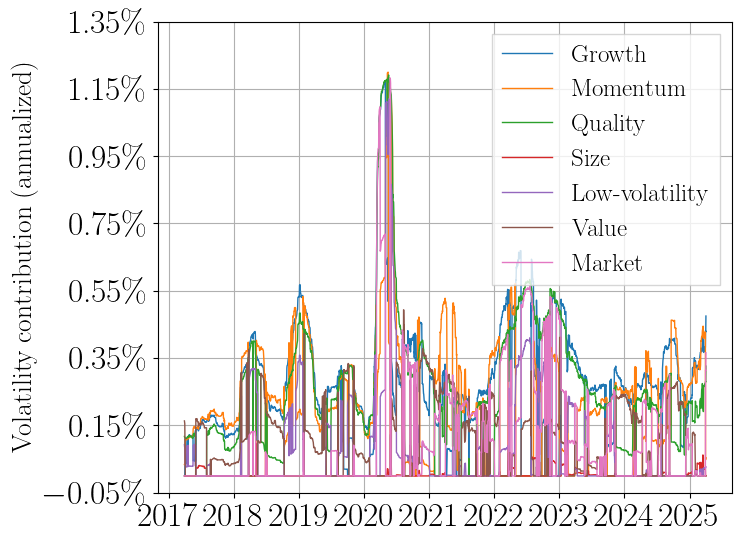

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

def plot_volatility_contributions(strategy_name,
                                  run_results,
                                  returns_df,
                                  factor_labels,
                                  window=60):          # rolling window (trading-days) for Σ
    # --- align weights & returns ----------------------------------------------
    w = run_results[strategy_name]["weights_view"]
    if "Risk-Off" not in strategy_name:
        w = w.drop(columns=["rf"], errors="ignore")
    w = w.reindex(returns_df.index).ffill().fillna(0)

    r = returns_df[w.columns].copy()

    # --- build rolling covariance cube ----------------------------------------
    # pandas stores a Panel-like MultiIndex (date, factor) x factor
    Σ = r.rolling(window).cov().dropna()

    # helper: marginal & total risk for a single date
    def _risk_decomp(t):
        s = Σ.loc[t]                         # cov-matrix at t  (DataFrame)
        w_t = w.loc[t].values               # weights vector   (np.array)
        σ_p = np.sqrt(w_t @ s.values @ w_t) # total portfolio σ
        if σ_p == 0:
            return pd.Series(0, index=s.index)

        mcr = s.values @ w_t / σ_p          # marginal contribs
        return pd.Series(w_t * mcr, index=s.index)

    # --- compute contribution series ------------------------------------------
    dates   = Σ.index.get_level_values(0).unique()
    contrib = pd.DataFrame({d: _risk_decomp(d) for d in dates}).T
    contrib = contrib.rename(columns=factor_labels)

    # use absolute values for the stacked %-share plot
    contrib_pos = contrib.abs()
    pct = contrib_pos.div(contrib_pos.sum(axis=1), axis=0)   # ← all ≥0

    total_vol = contrib_pos.sum(axis=1)  # matches the black line below

    # --- 1) %-share stacked area ----------------------------------------------
    # ax = pct.plot.area(figsize=(16,6))
    # ax.set_ylabel("Share of portfolio volatility")
    # ax.legend(loc="upper left")
    # ax.grid(True)
    # plt.show()

    # --- 2) absolute σ contributions & total σ --------------------------------
    contrib_pct = contrib * 100        # change units to %

    fig, ax = plt.subplots(figsize=(8, 6))

    # Plot each column
    for col in contrib_pct.columns:
        ax.plot(contrib_pct.index, contrib_pct[col], label=col, linewidth=1.0)

    # Y-axis settings
    ax.set_ylabel(r"Volatility contribution (annualized)", fontsize=20)
    ax.set_ybound(lower=-0.05, upper=1.35)
    ax.set_yticks(np.linspace(-0.05, 1.35, 8))
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(decimals=2))

    ax.tick_params(axis='both', labelsize=24)

    # Ticks, legend, and grid
    handles, labels = ax.get_legend_handles_labels()
    new_labels = []
    for lab in labels:
        # 1) extract inside parentheses (if any), else use full label
        m = re.search(r"\(([^)]*)\)", lab)
        text = m.group(1) if m else lab
        # 2) remove the word "factor" (case-insensitive) and strip whitespace
        text = re.sub(r"\bfactor\b", "", text, flags=re.IGNORECASE).strip()
        new_labels.append(text)
    ax.legend(handles, new_labels,
          loc="upper right",
          fontsize=18,
          frameon=True,
          fancybox=False)
    ax.grid(True)

    fig.tight_layout()
    fig.savefig("vol_contribution.png", dpi=300) 

    plt.show()





chosen_strategy = "Long-Only (4 per cent TE)"  
plot_volatility_contributions(chosen_strategy, run_results, test_df, factor_labels)


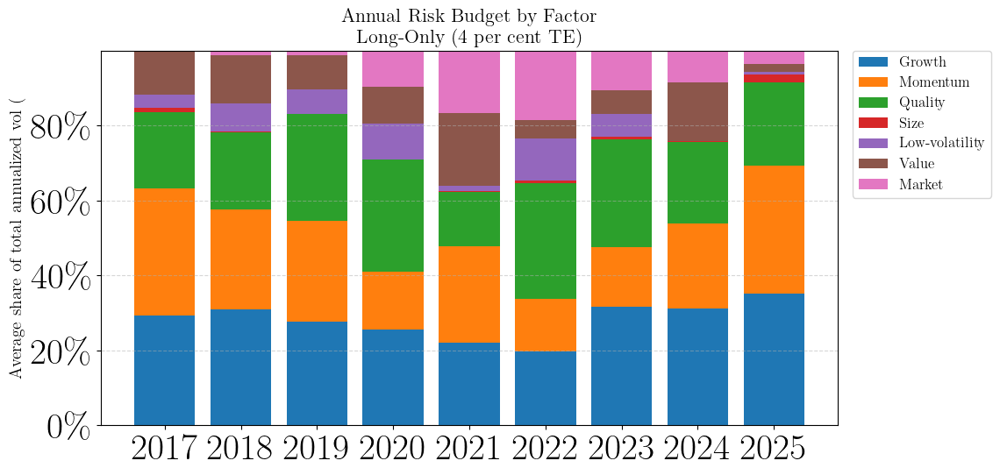

In [ ]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

def plot_volatility_contributions_yearly(strategy_name,
                                         run_results,
                                         returns_df,
                                         factor_labels,
                                         window=60):
    # --- align weights & returns ----------------------------------------------
    w = run_results[strategy_name]["weights_actual"]
    if "Risk-Off" not in strategy_name:
        w = w.drop(columns=["rf"], errors="ignore")
    w = w.reindex(returns_df.index).ffill().fillna(0)
    r = returns_df[w.columns].copy()

    # --- rolling covariance cube & risk‐decomp ---------------------------------
    Σ = r.rolling(window).cov().dropna()
    def _risk_decomp(t):
        s   = Σ.loc[t]
        w_t = w.loc[t].values
        σ_p = np.sqrt(w_t @ s.values @ w_t)
        if σ_p == 0:
            return pd.Series(0, index=s.index)
        mcr = s.values @ w_t / σ_p
        return pd.Series(w_t * mcr, index=s.index)

    dates   = Σ.index.get_level_values(0).unique()
    contrib = pd.DataFrame({d: _risk_decomp(d) for d in dates}).T
    contrib = contrib.rename(columns=factor_labels)

    # --- compute daily shares & annualize -------------------------------------
    # absolute daily contribs → annualized via √252  (but share is scale-free)
    contrib_pos = contrib.abs() * np.sqrt(252)
    pct_yearly = (contrib_pos
                  .div(contrib_pos.sum(axis=1), axis=0)
                  .groupby(contrib_pos.index.year)
                  .mean()
                 ) * 100  # in percent

    # --- plotting stacked‐bar per year ----------------------------------------
    years  = pct_yearly.index.astype(str)
    factors = pct_yearly.columns.tolist()

    fig, ax = plt.subplots(figsize=(12,6))
    bottom = np.zeros(len(years))
    for fac in factors:
        vals = pct_yearly[fac].values
        ax.bar(years, vals, bottom=bottom, label=fac)
        bottom += vals

    ax.set_ylabel("Average share of total annualized vol (%)", fontsize=14)
    ax.set_title(f"Annual Risk Budget by Factor\n{strategy_name}", fontsize=16)
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())
    ax.grid(axis='y', linestyle='--', alpha=0.5)

    # clean legend names
    h, l = ax.get_legend_handles_labels()
    new_l = []
    for lab in l:
        m   = re.search(r"\(([^)]*)\)", lab)
        txt = m.group(1) if m else lab
        txt = re.sub(r"\bfactor\b", "", txt, flags=re.IGNORECASE).strip()
        new_l.append(txt)

    # place legend outside
    ax.legend(h, new_l,
              bbox_to_anchor=(1.02, 1.00),
              loc="upper left",
              borderaxespad=0.0,
              fontsize=12)

    plt.tight_layout()
    plt.show()


# --- Usage ---
chosen = "Long-Only (4 per cent TE)"
plot_volatility_contributions_yearly(chosen,
                                     run_results,
                                     test_df,
                                     factor_labels)


Strategy analysed : Risk-off 4% TE  ➜  Long-Only with Risk-Off (4 per cent TE)
Benchmark         : Benchmark (Q-Rebalanced EW)

Allocation added value  (eq 8a) : -2.33%
Static allocation value (eq 8b) : -1.38%
Dynamic allocation      (=8a−8b): -0.95%

        Allocation 8a  Static 8b   Dynamic
Market       0.001436  -0.000132  0.001568
iwf         -0.000424   0.001010 -0.001434
mtum        -0.001415   0.001187 -0.002602
qual         0.000634   0.000592  0.000042
rf          -0.035334  -0.023720 -0.011614
size         0.010506   0.005962  0.004544
usmv        -0.002930   0.000657 -0.003588
vlue         0.004214   0.000644  0.003570


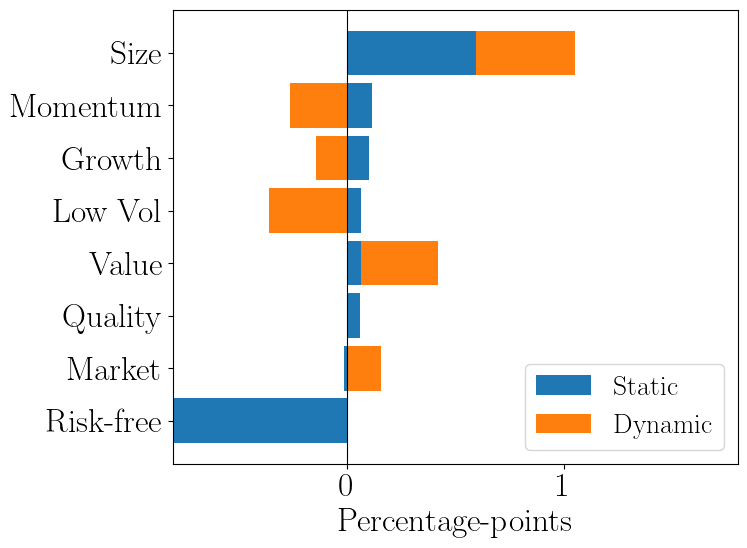

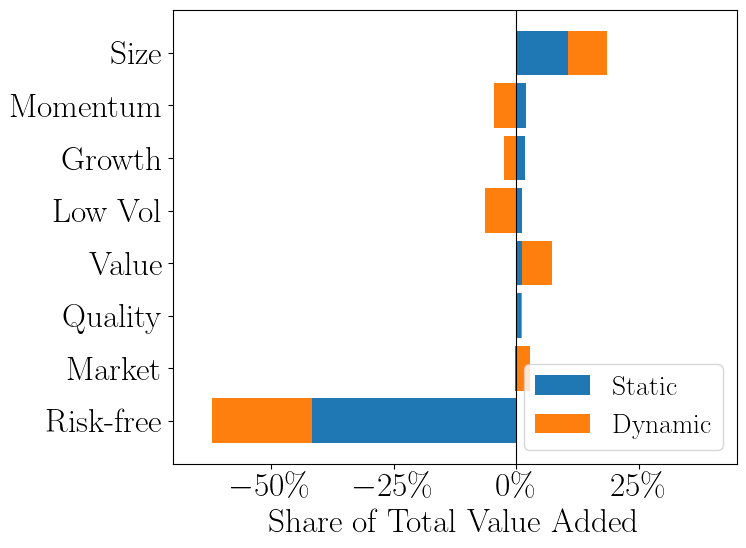

In [ ]:
# ================================================================
#  Hsu–Kalesnik–Myers (2010) arithmetic attribution
#  ---------------------------------------------------------------
#  • Works on ANY strategy held in `run_results`
#  • Pick the strategy you want with the `strategy_choice` toggle
#  • Computes
#        – Allocation added value       (eq. 8a)
#        – Static  allocation added value (eq. 8b)
#        – Dynamic allocation            (= 8a − 8b)
# ================================================================
import matplotlib.ticker as mtick
# ----------------------------------------------------------------
# 2️⃣  USER TOGGLE: pick any key from the `strategy_labels` dict
# ----------------------------------------------------------------
strategy_choice  = "Risk-off 4% TE"           # <—— change at will
benchmark_choice = "Benchmark (Q-Rebalanced EW)"

strategy_label   = strategy_labels.get(strategy_choice,  strategy_choice)
benchmark_label  = strategy_labels.get(benchmark_choice, benchmark_choice)

# ----------------------------------------------------------------
# 3️⃣  Pull weights & returns  ───────────────────────────────────────────────
w_port  = run_results[strategy_label]  \
            .get("weights_actual", run_results[strategy_label]["weights_view"])
w_bench = run_results[benchmark_label] \
            .get("weights_actual", run_results[benchmark_label]["weights_view"])

# make sure we have an 'rf' column (all zeros) so no NaNs later
if 'rf' not in w_bench.columns:
    w_bench['rf'] = 0.0

# --- keep the same investable set everywhere (drop rf – or delete next 3 lines if you want to keep it) ---
# cols = w_port.columns.difference(['rf'])
# w_port  = w_port[cols]
# w_bench = w_bench[cols]

# --- use OPENING-OF-DAY weights (shift by one day) ---
w_port  = w_port.shift()
w_bench = w_bench.shift()

# --- drop the first row that is now NaN after shifting ---
w_port  = w_port.iloc[1:]
w_bench = w_bench.iloc[1:]

# --- align return matrix exactly with the weight columns & dates ---
factor_ret = test_df[w_port.columns].loc[w_port.index]



# ----------------------------------------------------------------
# 4️⃣  HKM arithmetic allocation helpers
# ----------------------------------------------------------------
def hkm_allocation_effects(wp: pd.DataFrame,
                           wb: pd.DataFrame,
                           fr: pd.DataFrame):
    """
    Returns eq 8a (allocation) and eq 8b (static) from
    Hsu–Kalesnik–Myers (2010). Uses arithmetic means.
    """
    # --- benchmark total return each period  Rᵇ_t
    Rb_t = (wb * fr).sum(axis=1)                      # Series (T,)

    # --- eq 8a  Allocation added value
    alloc_term  = (wp - wb).mul(fr.sub(Rb_t, axis=0), axis=0)
    alloc_added = alloc_term.sum(axis=1).mean()

    # --- eq 8b  Static allocation added value
    avg_wdiff   = (wp - wb).mean()
    avg_excess  = fr.sub(Rb_t, axis=0).mean()
    static_added = (avg_wdiff * avg_excess).sum()

    return alloc_added, static_added

# ----------------------------------------------------------------
# 🔎 HKM arithmetic allocation – with factor-by-factor breakdown
# ----------------------------------------------------------------
def hkm_allocation_effects_breakdown(wp: pd.DataFrame,
                                     wb: pd.DataFrame,
                                     fr: pd.DataFrame):
    """
    • alloc_total   : eq 8a (scalar)
    • static_total  : eq 8b (scalar)
    • alloc_series  : eq 8a, factor-by-factor  (pd.Series, len = N)
    • static_series : eq 8b, factor-by-factor  (pd.Series, len = N)
    """
    # benchmark return each period  Rᵇ_t
    Rb_t = (wb * fr).sum(axis=1)

    # ----- eq 8a  allocation added value
    alloc_term     = (wp - wb).mul(fr.sub(Rb_t, axis=0), axis=0)   # T×N
    alloc_series   = alloc_term.mean()        # 1/T Σ_t (…)   – one number per factor
    alloc_total    = alloc_series.sum()       # sum_i

    # ----- eq 8b  static allocation added value
    avg_wdiff      = (wp - wb).mean()         # 1/T Σ_t (wᵖ−wᵇ)
    avg_excess     = fr.sub(Rb_t, axis=0).mean()   # 1/T Σ_t (Rᵇ_i−Rᵇ_t)
    static_series  = avg_wdiff * avg_excess   # term-by-term product
    static_total   = static_series.sum()

    return alloc_total, static_total, alloc_series, static_series


# ----------------------------------------------------------------
# 5️⃣  Run the attribution for the chosen strategy
# ----------------------------------------------------------------
alloc_val, static_val = hkm_allocation_effects(w_port, w_bench, factor_ret)
dynamic_val           = alloc_val - static_val

print(f"Strategy analysed : {strategy_choice}  ➜  {strategy_label}")
print(f"Benchmark         : {benchmark_choice}")
print()
print(f"Allocation added value  (eq 8a) : {alloc_val*252 : .2%}")
print(f"Static allocation value (eq 8b) : {static_val*252: .2%}")
print(f"Dynamic allocation      (=8a−8b): {dynamic_val*252: .2%}")

# ----------------------------------------------------------------
# 5️⃣  Run it
# ----------------------------------------------------------------
alloc_tot, static_tot, alloc_ser, static_ser = (
    hkm_allocation_effects_breakdown(w_port, w_bench, factor_ret)
)
dynamic_ser = alloc_ser - static_ser            # factor-level dynamic
dynamic_tot = alloc_tot - static_tot            # already had this

# OPTIONAL: annualise (if inputs are daily)
annualise = 252
alloc_ser_yr   = alloc_ser   * annualise
static_ser_yr  = static_ser  * annualise
dynamic_ser_yr = dynamic_ser * annualise

breakdown = pd.DataFrame({
    "Allocation 8a": alloc_ser_yr,
    "Static 8b":    static_ser_yr,
    "Dynamic":      dynamic_ser_yr
})

print()
print(breakdown)

plt.rcParams.update({'font.size': 20})

# ---------------------------------------------------------------
# Factor label mapping
# ---------------------------------------------------------------
factor_labels_attrib = {
    "iwf":  "Growth",
    "mtum": "Momentum",
    "qual": "Quality",
    "size": "Size",
    "usmv": "Low Vol",
    "vlue": "Value",
    "Market": "Market",
    "rf":     "Risk-free"
}

# ---------------------------------------------------------------
# Build DataFrame with factor contributions (annual %‑points)
# ---------------------------------------------------------------
df_attrib = pd.DataFrame({
    "Static": static_ser_yr * 100,
    "Dynamic":     dynamic_ser_yr * 100,
})

# Apply nicer factor names (leave unmapped items untouched)
df_attrib.index = df_attrib.index.map(lambda x: factor_labels_attrib.get(x, x))

#df_attrib = df_attrib.drop(index="rf", errors="ignore")

# Sort as desired (e.g. by Dynamic)
df_attrib = df_attrib.sort_values("Static", ascending=True)

# ---------------------------------------------------------------
# Horizontal bar plot
# ---------------------------------------------------------------
# set base font size
static  = df_attrib["Static"].values
dynamic = df_attrib["Dynamic"].values

# for each row:
#  • if static and dynamic have the same sign, start at static
#  • otherwise start at zero
left_dyn = np.where(np.sign(static)==np.sign(dynamic), static, 0)

fig, ax = plt.subplots(figsize=(8, 6))
plt.rcParams.update({'font.size': 24})
bar_w = 0.85
y     = np.arange(len(df_attrib))

ax.barh(y, static,  bar_w, label="Static")
ax.barh(y, dynamic, bar_w, left=left_dyn, label="Dynamic")

ax.set_yticks(y)
ax.set_yticklabels(df_attrib.index, fontsize=24)
ax.set_xlabel("Percentage-points", fontsize=24)
ax.axvline(0, color="black", linewidth=0.8)
ax.tick_params(labelsize=24)
ax.legend(fontsize=20, loc="lower right")
ax.margins(x=0.05)
ax.set_xbound(-0.8, 1.8)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------

# 1. Compute each factor’s total contribution (static + dynamic)
total_contrib = df_attrib["Static"] + df_attrib["Dynamic"]

# 2. Compute each piece as % of the sum of total contributions
total_value = total_contrib.abs().sum()
df_share = pd.DataFrame({
    "Static %":  df_attrib["Static"]  / total_value*100,
    "Dynamic %": df_attrib["Dynamic"] / total_value*100 
})

df_share = df_share.drop(index="Risk-free", errors="ignore")

static  = df_share["Static %"].values
dynamic = df_share["Dynamic %"].values
left_dyn = np.where(np.sign(static)==np.sign(dynamic), static, 0)


y = np.arange(len(df_share))
fig, ax = plt.subplots(figsize=(8,6))

# static first
ax.barh(y, static, 0.85, label="Static")
# dynamic second, but only offset by static when same‐sign
ax.barh(y, dynamic, 0.85, left=left_dyn, label="Dynamic")

ax.set_yticks(y)
ax.set_yticklabels(df_share.index, fontsize=24)
ax.set_xlabel("Share of Total Value Added", fontsize=24)
ax.axvline(0, color="black", linewidth=0.8)
ax.tick_params(labelsize=24)
ax.legend(fontsize=20, loc="lower right")
ax.margins(x=0.05)
ax.set_xbound(-20, 45)
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.tight_layout()
plt.show()

In [18]:
# NEW OPDYKE Z-TEST (2023) – FIXED VARIANCE TERM

import numpy as np
from scipy import stats


def _moments(x):
    μ  = x.mean()
    σ  = x.std(ddof=1)         
    m3 = ((x - μ) ** 3).mean()
    m4 = ((x - μ) ** 4).mean()
    γ3, γ4 = m3 / σ**3, m4 / σ**4
    return μ, σ, γ3, γ4


def _var_sr(μ, σ, γ3, γ4, SR, T):
    # Opdyke (2006) eq. 6
    return ((γ4 - 1) - 2 * SR * γ3 + (γ4 - 1) * SR**2) / (4 * T)


def _cross_moments(a, b):
    """Unbiased h-statistics for μ22, μ12, μ21 – Opdyke App. C."""
    n   = len(a)
    da  = a - a.mean()
    db  = b - b.mean()

    s1a = da.sum();              s1b = db.sum()
    s2a = (da ** 2).sum();       s2b = (db ** 2).sum()
    s11 = (da * db).sum()

    μ22 = (n * s2a * s2b - (n + 1) * s2a * s2b + 2 * s11**2) / (n * (n - 1) * (n - 2) * (n - 3))
    μ12 = (n * (da * db**2).sum() - 2 * s1a * s2b - s1b * s11) / (n * (n - 1) * (n - 2))
    μ21 = (n * (db * da**2).sum() - 2 * s1b * s2a - s1a * s11) / (n * (n - 1) * (n - 2))
    return μ22, μ12, μ21


def opdyke_z(a, b, rf=0.0, periods=252):
    ra = np.asarray(a) - np.asarray(rf)
    rb = np.asarray(b) - np.asarray(rf)
    mask = ~np.isnan(ra) & ~np.isnan(rb)
    ra, rb = ra[mask], rb[mask]
    T = len(ra)

    μa, σa, γ3a, γ4a = _moments(ra)
    μb, σb, γ3b, γ4b = _moments(rb)
    SRa, SRb = μa / σa, μb / σb

    Va = _var_sr(μa, σa, γ3a, γ4a, SRa, T)
    Vb = _var_sr(μb, σb, γ3b, γ4b, SRb, T)

    μ22, μ12, μ21 = _cross_moments(ra, rb)
    ρ = np.corrcoef(ra, rb)[0, 1]

    # Opdyke (2006) eq. 13 – no ½ in front of ρ SRa SRb
    Cab = (
        μ22 / (4 * σa**2 * σb**2)
        - SRa * μ12 / (2 * σa * σb**2)
        - SRb * μ21 / (2 * σa**2 * σb)
        + ρ * SRa * SRb                # ← fixed
    ) / T

    denom = Va + Vb - 2 * Cab
    # standard error of the annualized Sharpe difference
    se_diff = np.sqrt(denom * periods)
    if denom <= 0:
        return (
            SRa * np.sqrt(periods),
            SRb * np.sqrt(periods),
            se_diff,
            np.nan,
            np.nan,
        )

    z = (SRa - SRb) / np.sqrt(denom)
    p = 1 * (1 - stats.norm.cdf(abs(z)))
    return (
        SRa * np.sqrt(periods),
        SRb * np.sqrt(periods),
        se_diff,
        z,
        p,
    )

bench = ew_rets
rf_daily = etf_df["rf"].reindex(full_idx).fillna(0)
for name, res in run_results.items():
    sr_a, sr_b, se_diff, z, p = opdyke_z(
        res["returns"],
        bench,
        rf=rf_daily,       # ← now subtracts the right rf each day
    )
    print(
        f"{name:30s}  "
        f"SR₁={sr_a:.3f}, SR₂={sr_b:.3f}, ΔSR={sr_a-sr_b:+.3f}, "
        f"Std.Err.(diff)={se_diff:.3f}, z={z:+.2f}, p={p:.3f}"
    )

Long-Only (4 per cent TE)       SR₁=0.596, SR₂=0.527, ΔSR=+0.069, Std.Err.(diff)=0.999, z=+0.07, p=0.473
Long-Only (3 per cent TE)       SR₁=0.577, SR₂=0.527, ΔSR=+0.050, Std.Err.(diff)=1.008, z=+0.05, p=0.480
Long-Only (2 per cent TE)       SR₁=0.568, SR₂=0.527, ΔSR=+0.041, Std.Err.(diff)=1.010, z=+0.04, p=0.484
Long-Only (1 per cent TE)       SR₁=0.564, SR₂=0.527, ΔSR=+0.037, Std.Err.(diff)=1.019, z=+0.04, p=0.486
Long-Short (4 per cent TE)      SR₁=0.555, SR₂=0.527, ΔSR=+0.028, Std.Err.(diff)=0.995, z=+0.03, p=0.489
Long-Short (3 per cent TE)      SR₁=0.554, SR₂=0.527, ΔSR=+0.028, Std.Err.(diff)=1.002, z=+0.03, p=0.489
Long-Short (2 per cent TE)      SR₁=0.564, SR₂=0.527, ΔSR=+0.037, Std.Err.(diff)=1.009, z=+0.04, p=0.485
Long-Short (1 per cent TE)      SR₁=0.562, SR₂=0.527, ΔSR=+0.036, Std.Err.(diff)=1.020, z=+0.03, p=0.486
Long-Only with Risk-Off (4 per cent TE)  SR₁=0.565, SR₂=0.527, ΔSR=+0.038, Std.Err.(diff)=0.887, z=+0.04, p=0.483
Long-Only with Risk-Off (3 per cent TE)  SR₁=0

In [19]:
from scipy import stats
import numpy as np

def opdyke_and_regular_z(a, b, rf=0.0, periods=252):
    # -- same prep as before --
    ra, rb = np.asarray(a) - rf, np.asarray(b) - rf
    mask = ~np.isnan(ra) & ~np.isnan(rb)
    ra, rb = ra[mask], rb[mask]
    T = len(ra)

    μa, σa, γ3a, γ4a = _moments(ra)
    μb, σb, γ3b, γ4b = _moments(rb)
    SRa, SRb = μa / σa, μb / σb

    # Opdyke variance
    Va = _var_sr(μa, σa, γ3a, γ4a, SRa, T)
    Vb = _var_sr(μb, σb, γ3b, γ4b, SRb, T)
    μ22, μ12, μ21 = _cross_moments(ra, rb)
    rho = np.corrcoef(ra, rb)[0, 1]
    Cab = ((μ22 / (4 * σa**2 * σb**2)
            - SRa * μ12 / (2 * σa * σb**2)
            - SRb * μ21 / (2 * σa**2 * σb)
            + 0.5 * rho * SRa * SRb) / T)
    denom_op = Va + Vb - 2 * Cab

    if denom_op <= 0:
        z_op, p_op, se_op = np.nan, np.nan, np.nan
    else:
        se_op_daily = np.sqrt(denom_op)
        se_op = se_op_daily * np.sqrt(periods)
        z_op = (SRa - SRb) / se_op_daily
        p_op = 2 * (1 - stats.norm.cdf(abs(z_op)))

    # ——— regular Normal‐theory z‐test ———
    var_na = (1 + 0.5 * SRa**2) / T
    var_nb = (1 + 0.5 * SRb**2) / T
    denom_reg = var_na + var_nb

    se_reg_daily = np.sqrt(denom_reg)
    se_reg = se_reg_daily * np.sqrt(periods)
    z_reg = (SRa - SRb) / se_reg_daily
    p_reg = 2 * (1 - stats.norm.cdf(abs(z_reg)))

    # return annualized SRs, SEs, and both z‐tests
    return (
        SRa * np.sqrt(periods),
        SRb * np.sqrt(periods),
        se_op,
        se_reg,
        z_op,
        p_op,
        z_reg,
        p_reg
    )

# usage
bench = ew_rets
for name, res in run_results.items():
    sr_a, sr_b, se_op, se_reg, z_op, p_op, z_reg, p_reg = \
        opdyke_and_regular_z(res["returns"], bench)
    print(
        f"{name:30s} "
        f"ΔSR={sr_a-sr_b:+.3f} | "
        f"SE_op={se_op:+.3f} | SE_reg={se_reg:+.3f} | "
        f"Opdyke z={z_op:+.3f}, p={p_op:.3f} | "
        f"Normal z={z_reg:+.3f}, p={p_reg:.3f}"
    )


Long-Only (4 per cent TE)      ΔSR=+0.066 | SE_op=+1.000 | SE_reg=+0.493 | Opdyke z=+0.066, p=0.947 | Normal z=+0.134, p=0.894
Long-Only (3 per cent TE)      ΔSR=+0.050 | SE_op=+1.009 | SE_reg=+0.493 | Opdyke z=+0.049, p=0.961 | Normal z=+0.101, p=0.919
Long-Only (2 per cent TE)      ΔSR=+0.044 | SE_op=+1.011 | SE_reg=+0.493 | Opdyke z=+0.044, p=0.965 | Normal z=+0.090, p=0.928
Long-Only (1 per cent TE)      ΔSR=+0.044 | SE_op=+1.020 | SE_reg=+0.493 | Opdyke z=+0.043, p=0.966 | Normal z=+0.089, p=0.929
Long-Short (4 per cent TE)     ΔSR=+0.024 | SE_op=+0.996 | SE_reg=+0.493 | Opdyke z=+0.024, p=0.981 | Normal z=+0.048, p=0.962
Long-Short (3 per cent TE)     ΔSR=+0.028 | SE_op=+1.003 | SE_reg=+0.493 | Opdyke z=+0.028, p=0.978 | Normal z=+0.057, p=0.955
Long-Short (2 per cent TE)     ΔSR=+0.041 | SE_op=+1.010 | SE_reg=+0.493 | Opdyke z=+0.041, p=0.967 | Normal z=+0.084, p=0.933
Long-Short (1 per cent TE)     ΔSR=+0.043 | SE_op=+1.021 | SE_reg=+0.493 | Opdyke z=+0.042, p=0.967 | Normal z=

In [26]:
from statsmodels.stats.diagnostic import acorr_ljungbox
import statsmodels.api as sm
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import acf
from scipy import stats
import scipy.stats as ss

def pick_nw_lags(series, max_lags=20, alpha=0.05):
    x = np.asarray(series)
    T = len(x)
    acfs = acf(x, nlags=max_lags, fft=False)
    bound = ss.norm.ppf(1 - alpha/2) / np.sqrt(T)
    sig = np.where(np.abs(acfs[1:]) > bound)[0] + 1
    return int(sig.max()) if sig.size else 0

def nw_lag_rule(T: int) -> int:
    """
    Newey-West Bartlett-kernel bandwidth:
        L = ⌊ 4 (T / 100)^(2/9) ⌋
    Ensures at least 1 lag.
    """
    return max(1, int(np.floor(4 * (T / 100) ** (2 / 9))))

def test_active_return_vs_benchmark(
    strategy_returns,
    benchmark_returns,
    max_check_lags: int = 20,
    alpha: float = 0.05
):
    """
    Test if active returns (strategy - benchmark) have non-zero mean.
    Always uses Newey-West with a data-driven lag choice.
    Returns annualized mean, its SE, t-stat, p-value,
    whether LB detected autocorrelation, and the lag used.
    """
    strat = pd.Series(strategy_returns)
    bench = pd.Series(benchmark_returns)
    strat, bench = strat.align(bench, join="inner")
    active = strat - bench
    T = len(active)

    # 1) pick an “optimal” HAC lag from the ACF
    #opt_lags = pick_nw_lags(active, max_lags=max_check_lags, alpha=alpha)
    opt_lags =  nw_lag_rule(T)

    # 2) still report what Ljung–Box would have said
    lb = acorr_ljungbox(active, lags=[opt_lags], return_df=True)
    lb_flag = lb["lb_pvalue"].iloc[0] < alpha

    # 3) intercept-only OLS with HAC(opt_lags)
    X = np.ones((T, 1))          # (T,) will raise in recent statsmodels
    model = sm.OLS(active, X)
    results = model.fit(cov_type="HAC", cov_kwds={"maxlags": opt_lags})

    # 4) annualize
    mean_ann = active.mean() * 252 * 100
    se_ann   = results.bse.iloc[0] * 252 * 100

    p_value = stats.t.sf(results.tvalues.iloc[0], df=results.df_resid)

    return {
        "mean_active_return": mean_ann,
        "std_err": se_ann,
        "t_stat": results.tvalues.iloc[0],
        "p_value": p_value,
        "ljungbox_detected": lb_flag,
        "hac_lags_used": opt_lags
    }

# — example usage —

ew = run_results["Benchmark (Q-Rebalanced EW)"]["returns"]
for name, res in run_results.items():
    if "Benchmark" in name:
        continue

    metrics = test_active_return_vs_benchmark(res["returns"], ew)
    print(
        f"{name:35s} Δμ={metrics['mean_active_return']:+.3f}%  "
        f"SE={metrics['std_err']:+.3f}%  t={metrics['t_stat']:+.3f}  "
        f"p={metrics['p_value']:.3f}  "
        f"lags={metrics['hac_lags_used']:.1f}"
    )


Long-Only (4 per cent TE)           Δμ=+1.617%  SE=+1.028%  t=+1.572  p=0.058  lags=7.0
Long-Only (3 per cent TE)           Δμ=+1.044%  SE=+0.924%  t=+1.130  p=0.129  lags=7.0
Long-Only (2 per cent TE)           Δμ=+0.528%  SE=+0.789%  t=+0.669  p=0.252  lags=7.0
Long-Only (1 per cent TE)           Δμ=+0.190%  SE=+0.655%  t=+0.290  p=0.386  lags=7.0
Long-Short (4 per cent TE)          Δμ=+0.978%  SE=+1.296%  t=+0.755  p=0.225  lags=7.0
Long-Short (3 per cent TE)          Δμ=+0.581%  SE=+1.075%  t=+0.540  p=0.295  lags=7.0
Long-Short (2 per cent TE)          Δμ=+0.395%  SE=+0.866%  t=+0.456  p=0.324  lags=7.0
Long-Short (1 per cent TE)          Δμ=+0.151%  SE=+0.675%  t=+0.224  p=0.412  lags=7.0
Long-Only with Risk-Off (4 per cent TE) Δμ=-2.879%  SE=+4.562%  t=-0.631  p=0.736  lags=7.0
Long-Only with Risk-Off (3 per cent TE) Δμ=-3.204%  SE=+4.548%  t=-0.705  p=0.759  lags=7.0
Long-Only with Risk-Off (2 per cent TE) Δμ=-3.525%  SE=+4.533%  t=-0.778  p=0.782  lags=7.0
Long-Only with Risk-

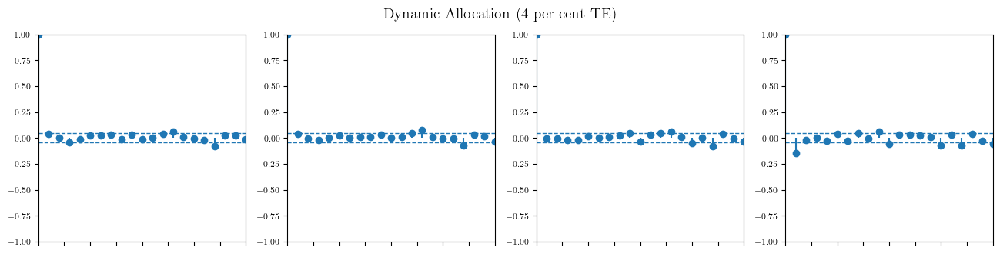

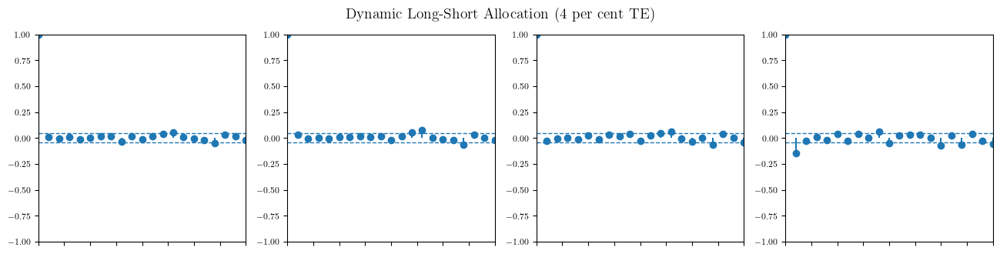

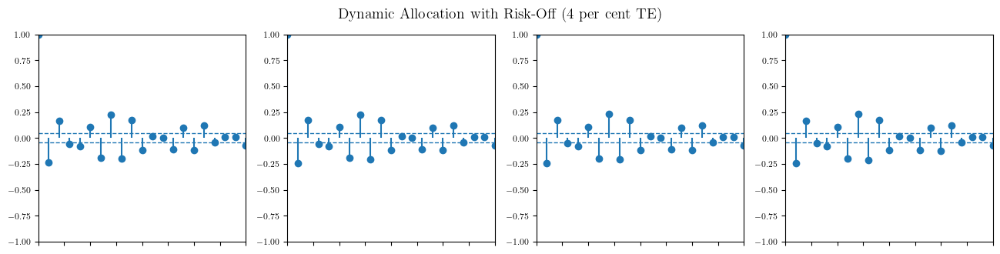

In [40]:
import numpy as np
import pandas as pd
from statsmodels.tsa.stattools import acf
import matplotlib.pyplot as plt
from scipy import stats

def plot_acf_ax(ax, series, max_lags=20, alpha=0.05):
    """
    Draws the ACF of `series` up to `max_lags` on Axes `ax`,
    with ±z_{α/2}/√T confidence bands, no axis‐labels, small ticks,
    and x‐ticks shown without labels.
    """
    x = np.asarray(series).flatten()
    T = len(x)
    acfs = acf(x, nlags=max_lags, fft=False)
    bound = stats.norm.ppf(1 - alpha/2) / np.sqrt(T)
    lags = np.arange(len(acfs))

    ax.stem(lags, acfs, basefmt=" ")
    ax.hlines([bound, -bound], 0, max_lags, linestyles='--', linewidth=1)
    ax.set_xlim(0, max_lags)
    ax.set_ylim(-1, 1)

    # remove axis labels
    ax.set_xlabel('')
    ax.set_ylabel('')

    # smaller tick labels
    ax.tick_params(axis='both', which='major', labelsize=8)

    # show x‐ticks (tick lines) but hide their labels
    ax.tick_params(axis='x', which='both', labelbottom=False)


# get your non-benchmark strategy names
strat_names = [n for n in run_results if "Benchmark" not in n]
# cap to 12 if needed
strat_names = strat_names[:12]

# chunk into 3 rows of 4
chunks = [strat_names[i*4:(i+1)*4] for i in range(3)]

for chunk in chunks:
    fig, axes = plt.subplots(1, len(chunk), figsize=(16, 3.5))
    # use only the first strat of this chunk as the plot title
    fig.suptitle(chunk[0], fontsize=14)
    
    for ax, name in zip(axes, chunk):
        strat = pd.Series(run_results[name]["returns"])
        bench = pd.Series(ew)
        active = (strat - bench).dropna()
        plot_acf_ax(ax, active, max_lags=20)
        # clear the subplot title
        ax.set_title('')
    
    # adjust layout to make room for suptitle
    # plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


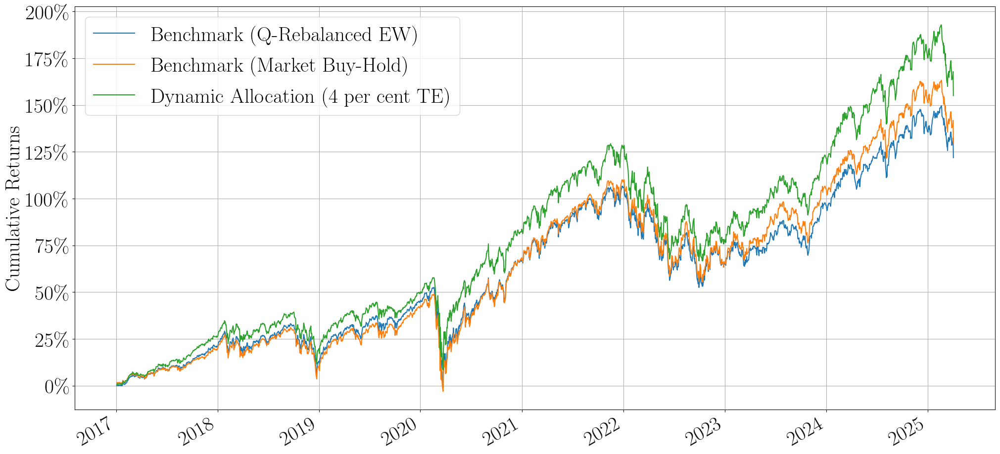

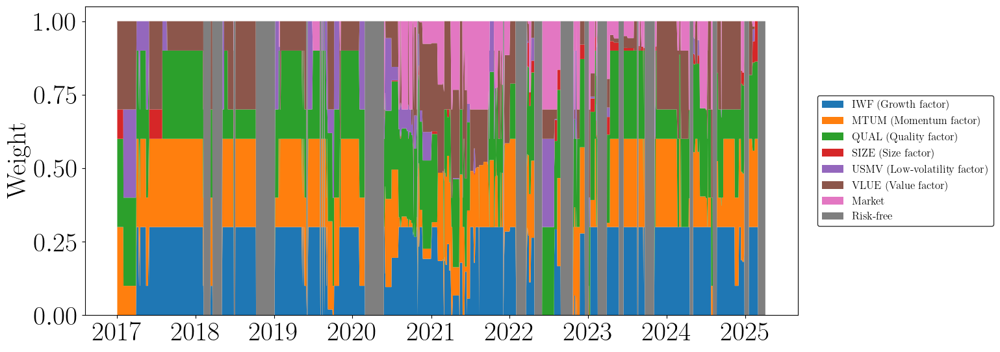

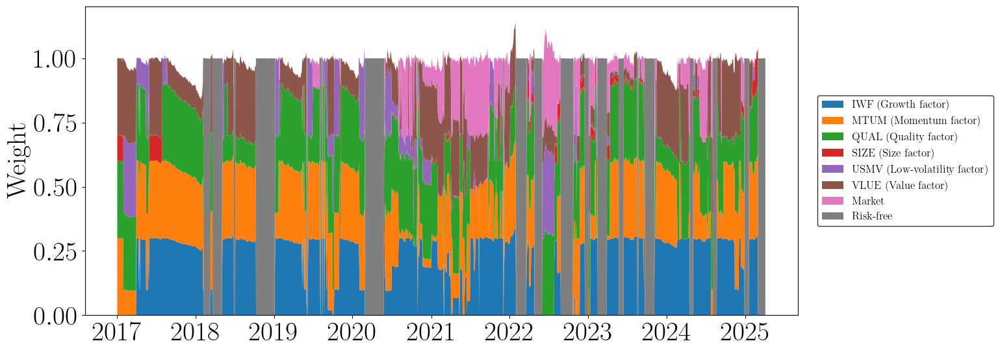

In [ ]:
# Plots for save
_update(
    compare=list(cmp.value),      # the configs you ticked in “Compare”
    weights_cfg=wgt.value,        # the config chosen in “Weights”
    sign_filter=sign.value        # 'both' / 'pos' / 'neg' from the toggle
)

                            CAPM beta
Strategy                             
Long-Only (4 per cent TE)       0.979
Long-Short (4 per cent TE)      0.984
Long-Only (1 per cent TE)       0.907
Long-Short (1 per cent TE)      0.905


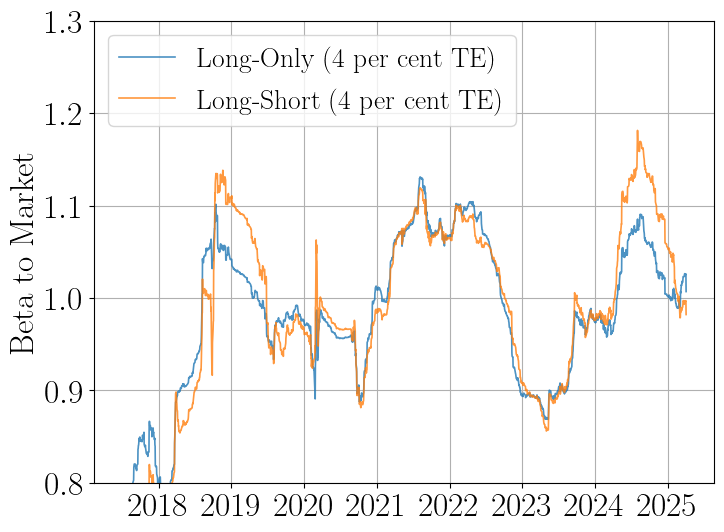

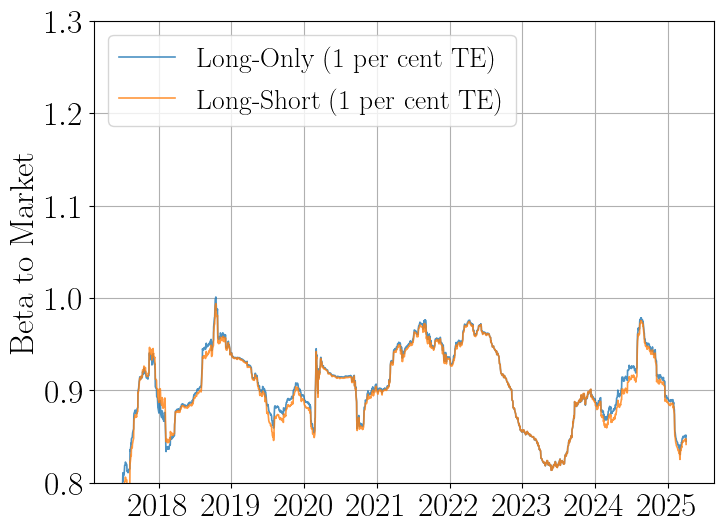

In [31]:
# ------------------------------------------------------------
# QUICK CHECK — Is the L/S book really beta-neutral?
# ------------------------------------------------------------
#
# 1)  Pick the strategies you want to test.
#     (Long-only vs. corresponding long-short at the same TE.)
# 2)  Regress each portfolio’s *excess* daily returns on the
#     market’s *excess* daily returns → CAPM beta.
# 3)  Print both the full-sample beta and a 6-month rolling beta
#     so you can see whether neutrality is stable through time.
#
# Assumes `run_results` (your strategies) and `etf_df["Market"]`
# are already in memory, exactly as in your notebook.
# ------------------------------------------------------------

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

def capm_beta(port_ret, mkt_ret):
    """OLS beta of portfolio excess return vs. market excess return."""
    y, x = port_ret.align(mkt_ret, join="inner")
    x = sm.add_constant(x)           # adds 'const' plus an unnamed column
    model = sm.OLS(y, x, missing="drop").fit()
    # beta is the coefficient after the intercept, whatever it's called
    return model.params.drop("const").iloc[0]



# -------- pick strategies ---------------------------------------
pairs = [
    ("Long-Only (4 per cent TE)",  "Long-Short (4 per cent TE)"),
    ("Long-Only (1 per cent TE)",  "Long-Short (1 per cent TE)"),
    # ("Base model 1% TE",  "L/S 1% TE"),
]

mkt = etf_df["Market"].loc[full_idx] - etf_df["rf"].loc[full_idx]   # excess market return

results = []

for long_only, long_short in pairs:
    for lab in (long_only, long_short):
        r  = run_results[lab]["returns"]       # daily total return
        rex = r - etf_df["rf"].reindex(r.index)  # excess return
        beta = capm_beta(rex, mkt)
        results.append({"Strategy": lab, "CAPM beta": beta})

df_beta = pd.DataFrame(results).set_index("Strategy")
print(df_beta.round(3))

# -------- optional: rolling beta plot ---------------------------
window = 126     # ~6 months of trading days

for long_only, long_short in pairs:
    fig, ax = plt.subplots(figsize=(8, 6))

    for lab, color in [(long_only, "tab:blue"), (long_short, "tab:orange")]:
        r = run_results[lab]["returns"]
        rex = r - etf_df["rf"].reindex(r.index)
        roll_beta = (
            rex.rolling(window)
               .cov(mkt)
               / mkt.rolling(window).var()
        )
        ax.plot(roll_beta.index, roll_beta.values, label=lab, color=color, alpha=0.8, lw=1.2)

    ax.axhline(0, color="grey", ls="--", linewidth=1.5)
    ax.set_ylabel("Beta to Market", fontsize=24)
    ax.set_xlabel("", fontsize=20)
    ax.set_ylim(0.8, 1.3)
    
    ax.legend(loc="upper left", fontsize=20)
    ax.grid(True)
    ax.tick_params(axis='both', labelsize=24)

    plt.show()



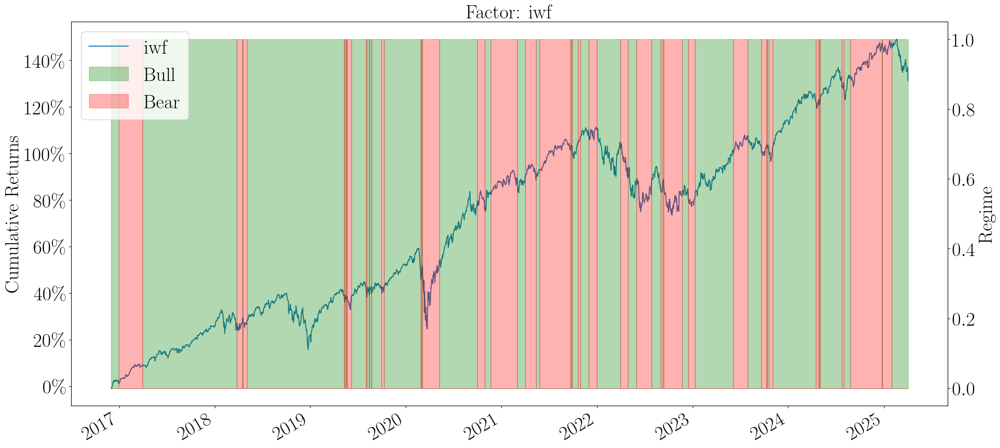

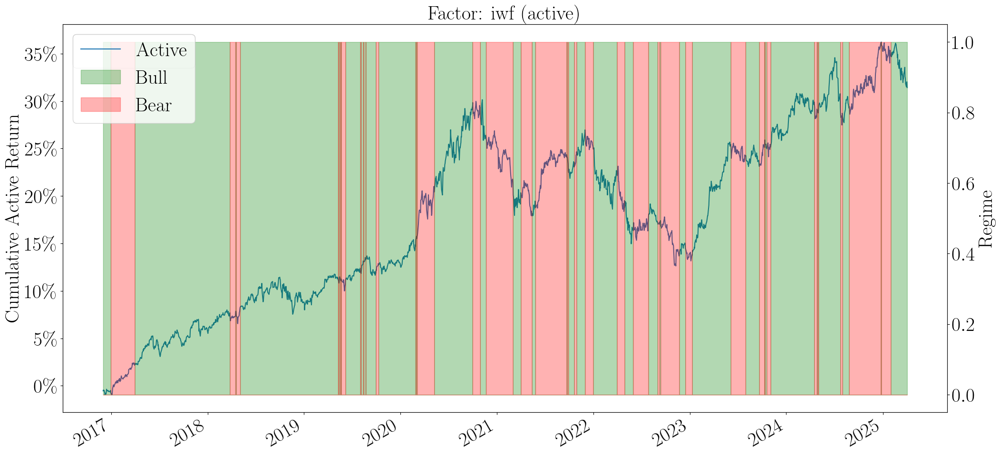

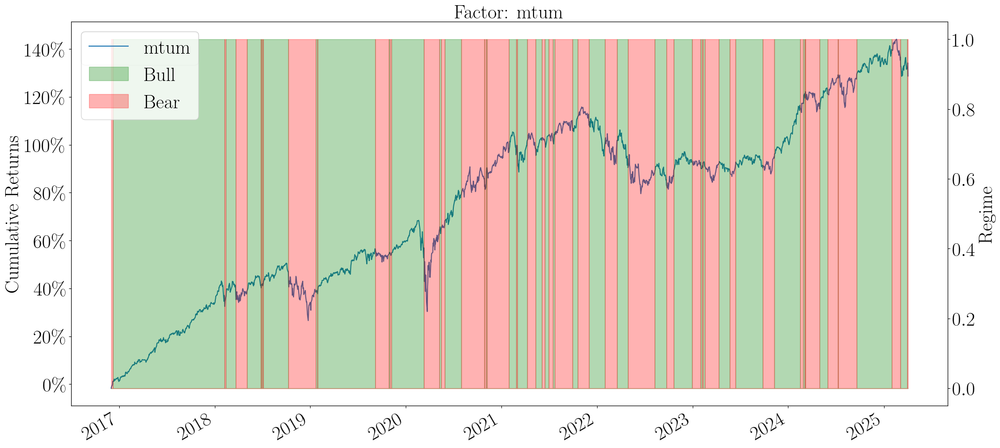

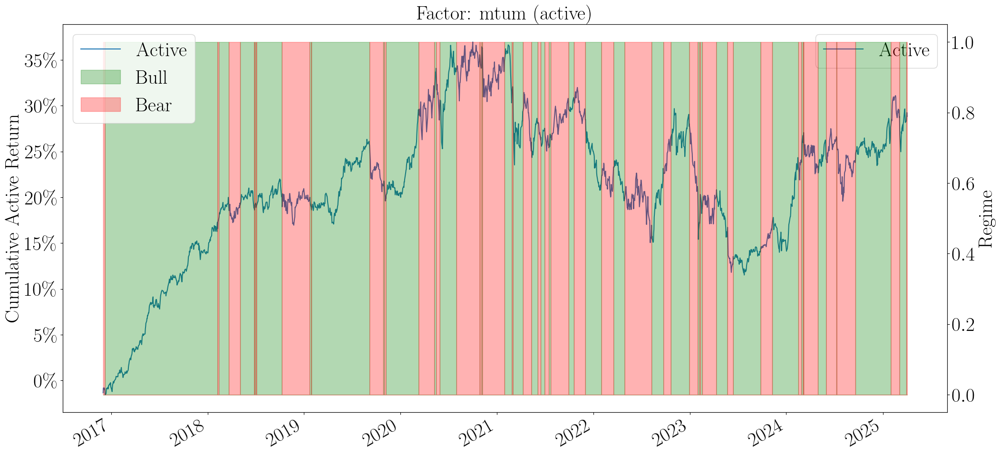

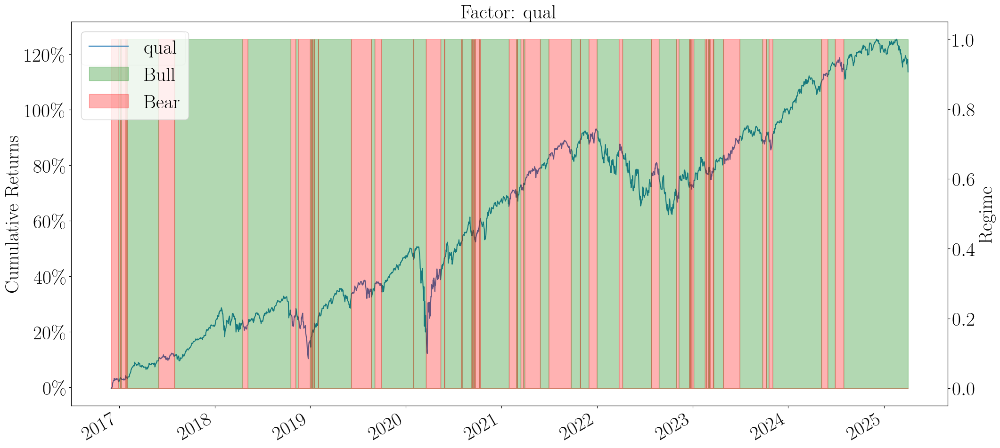

...

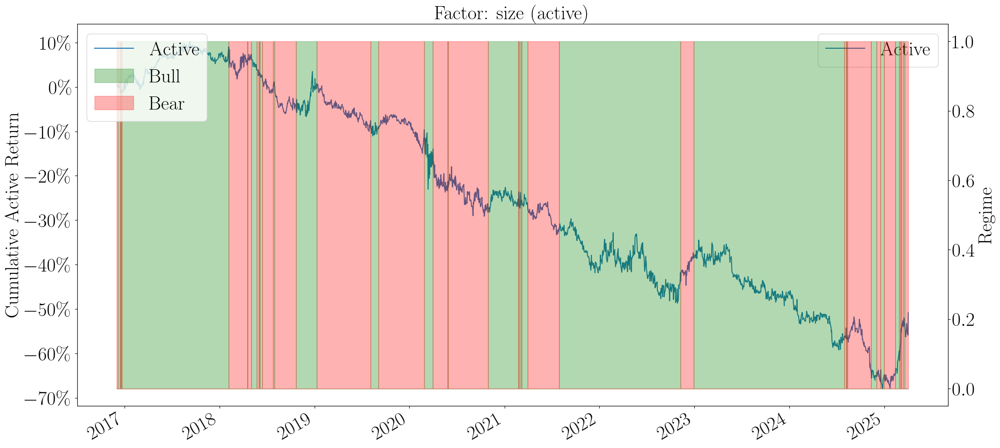

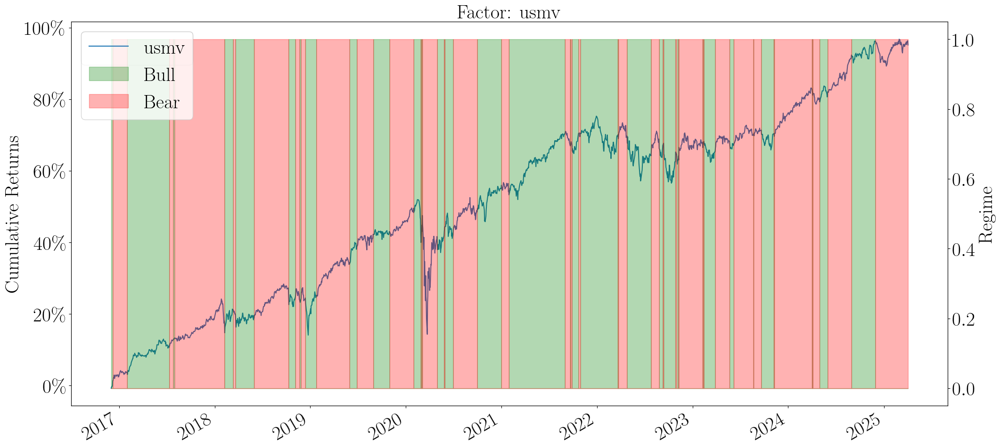

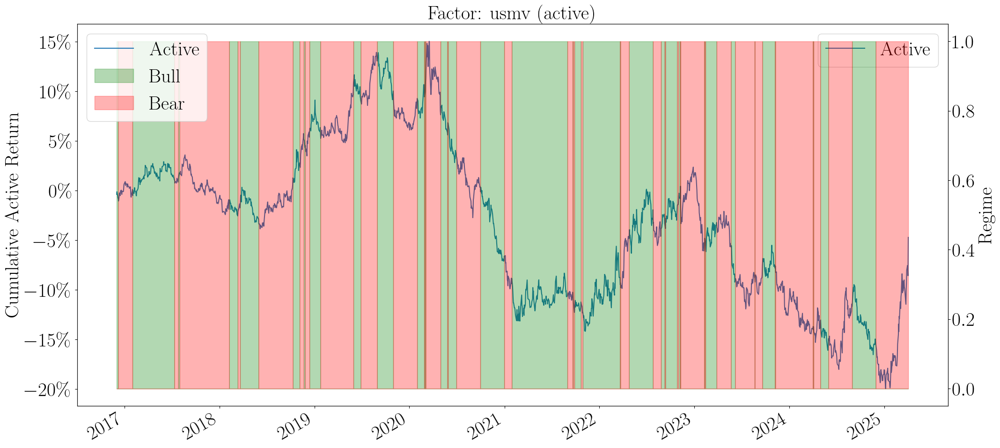

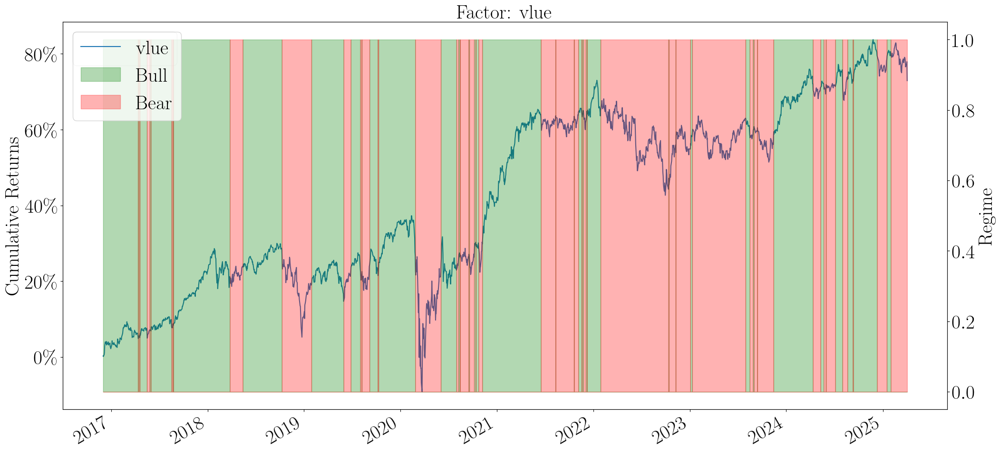

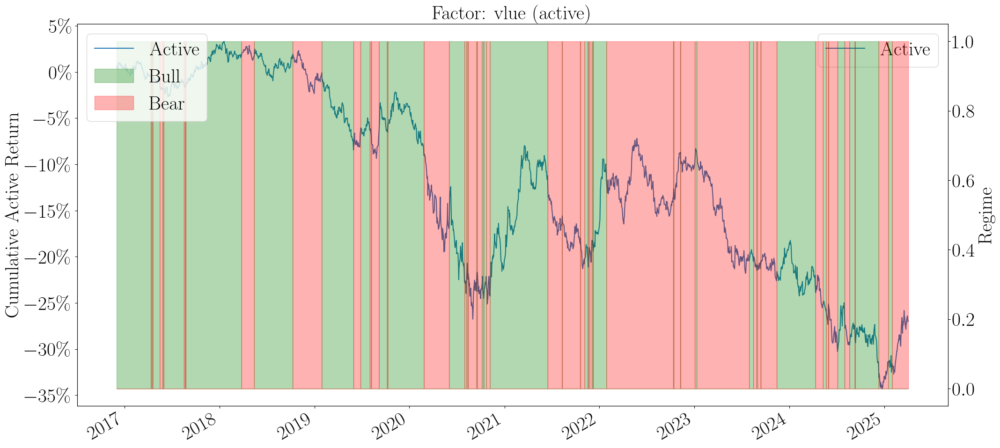

In [16]:
import matplotlib.pyplot as plt
from jumpmodels.plot import plot_regimes_and_cumret

for fac in factors:
    regimes     = factor_views[fac]["state"].dropna().astype(int)
    ret_raw     = factor_data_dict[fac]["fac_ret"].dropna()
    ret_active  = factor_data_dict[fac]["active_ret"].dropna()

    idx_raw    = regimes.index.intersection(ret_raw.index)
    idx_active = regimes.index.intersection(ret_active.index)

    # ---------- raw factor return ----------
    ax_raw, _ = plot_regimes_and_cumret(
        regimes.loc[idx_raw],
        ret_raw.loc[idx_raw],
        n_c=2,
        colors_regimes=['g','r'],
        labels_regimes=['Bull','Bear'],
        legend_loc='upper left'
    )
    ax_raw.set_title(f"Factor: {fac}")
    plt.show()

    # ---------- active return ----------
    ax_act, _ = plot_regimes_and_cumret(
        regimes.loc[idx_active],
        ret_active.loc[idx_active].to_frame("Active"),
        n_c=2,
        colors_regimes=['g','r'],
        labels_regimes=['Bull','Bear'],
        ylabel_ret="Cumulative Active Return",
        legend_loc='upper left'
    )
    ax_act.set_title(f"Factor: {fac} (active)")
    plt.show()

    


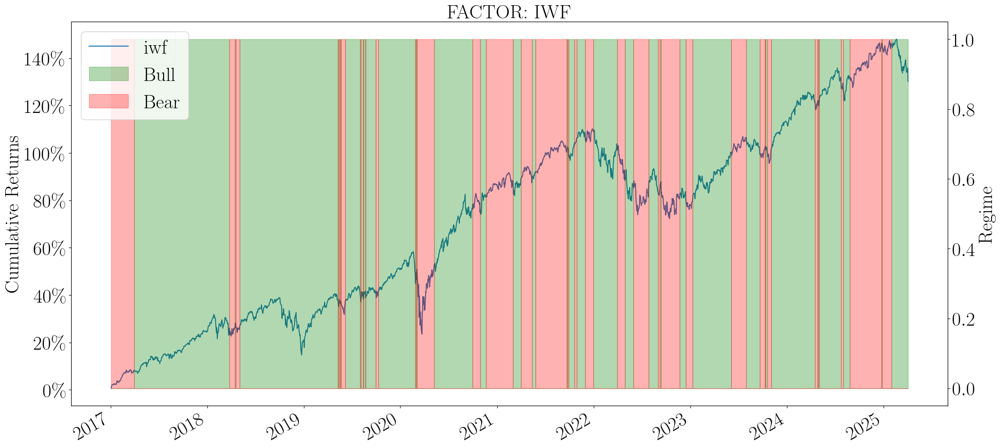

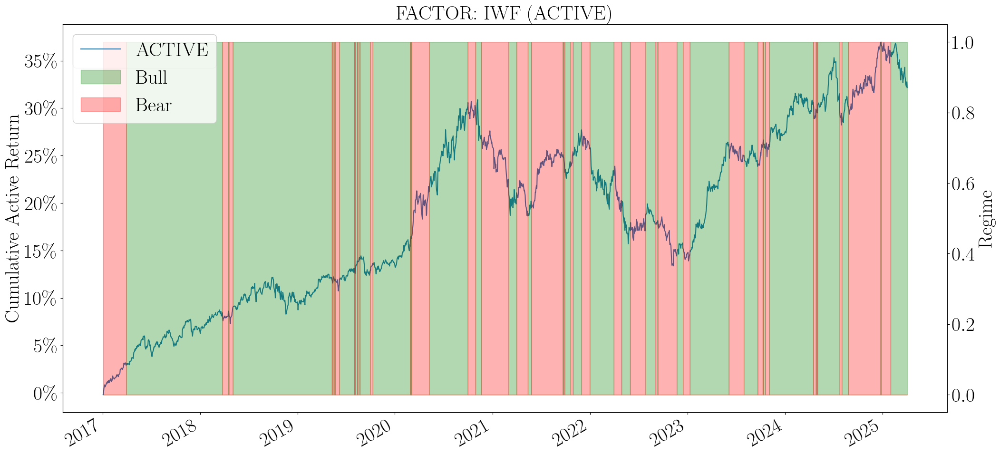

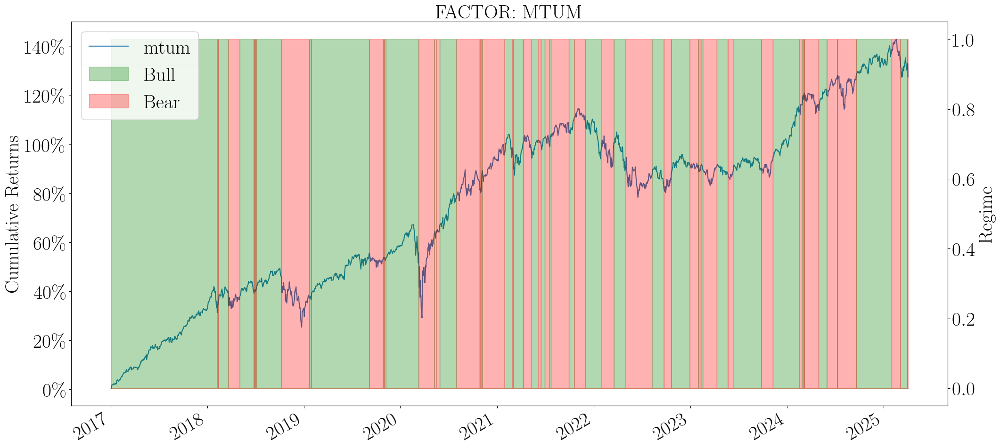

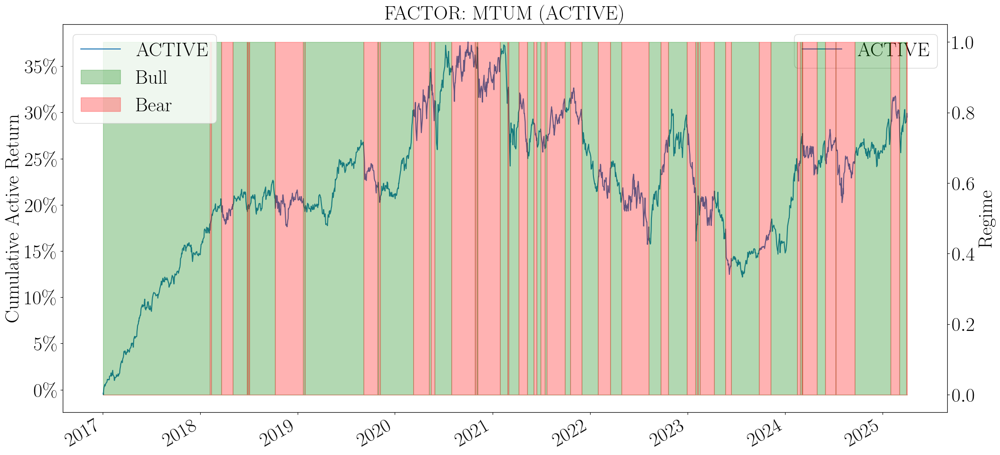

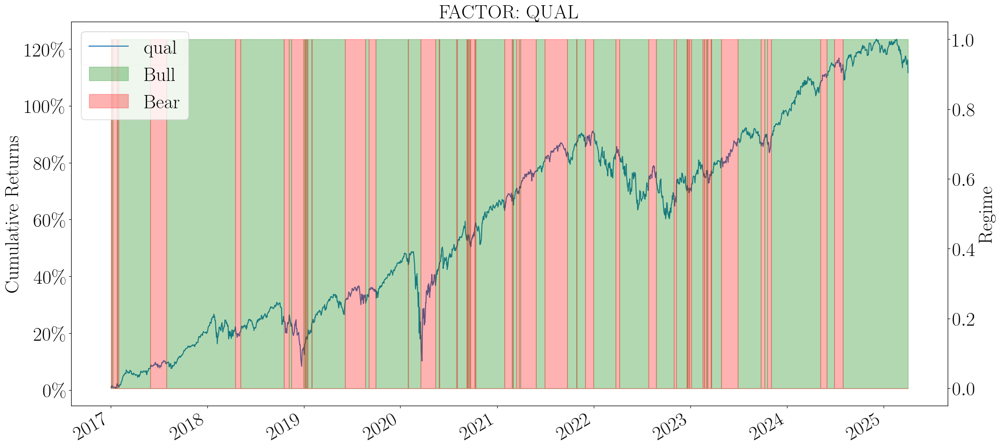

...

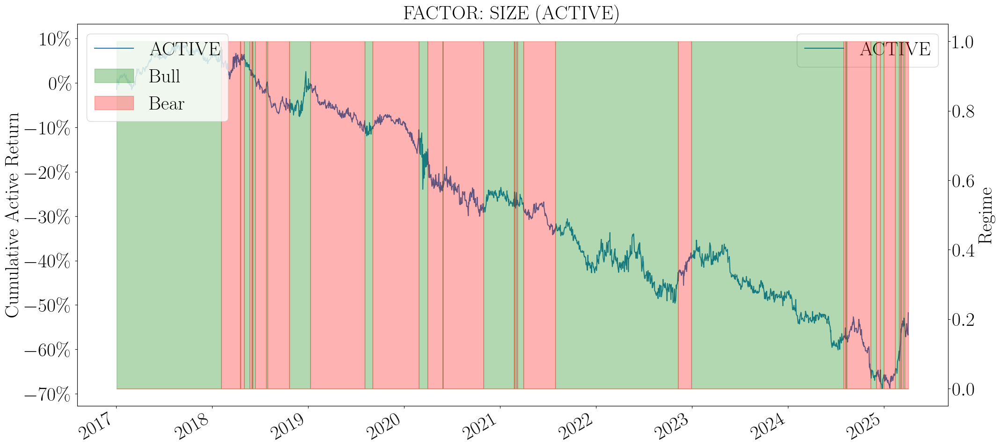

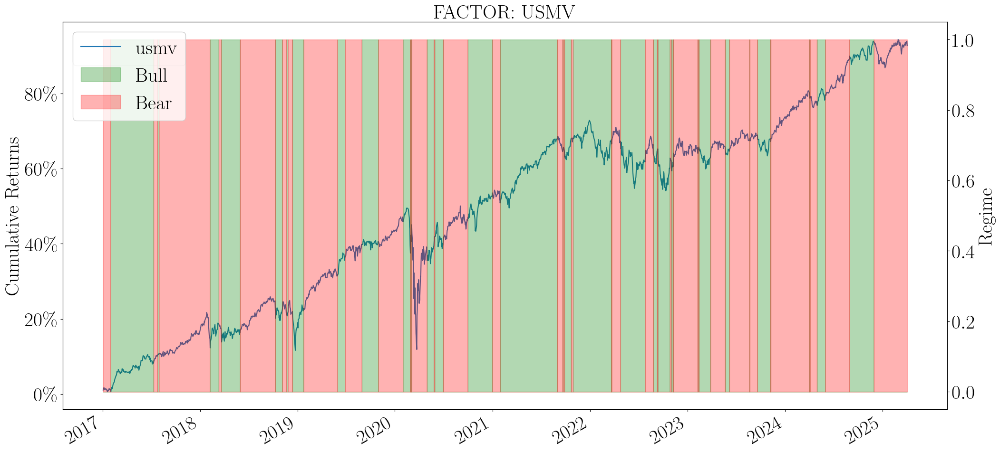

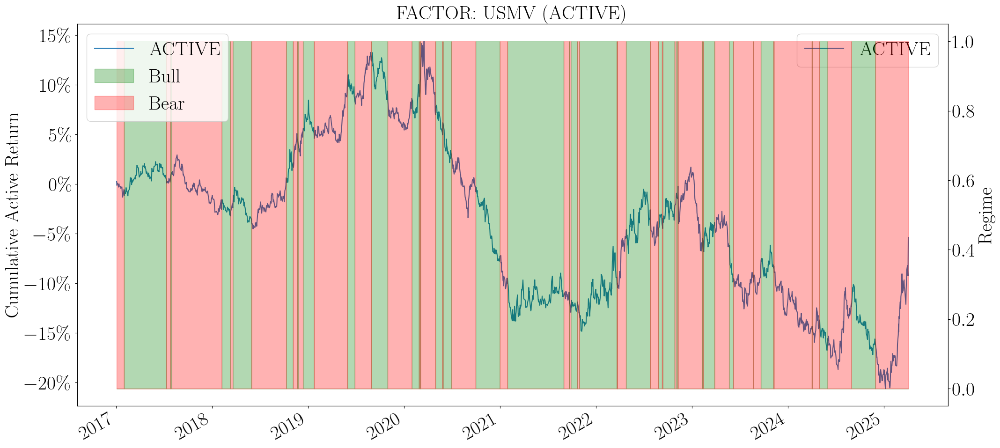

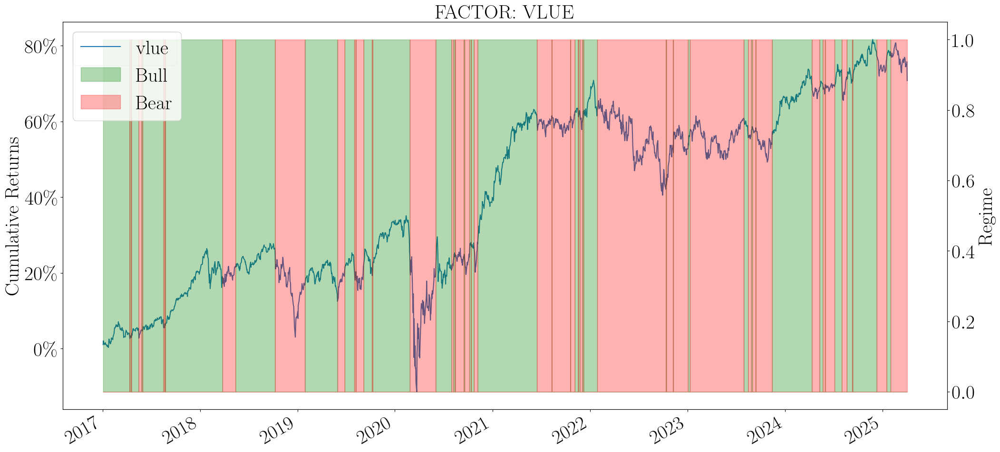

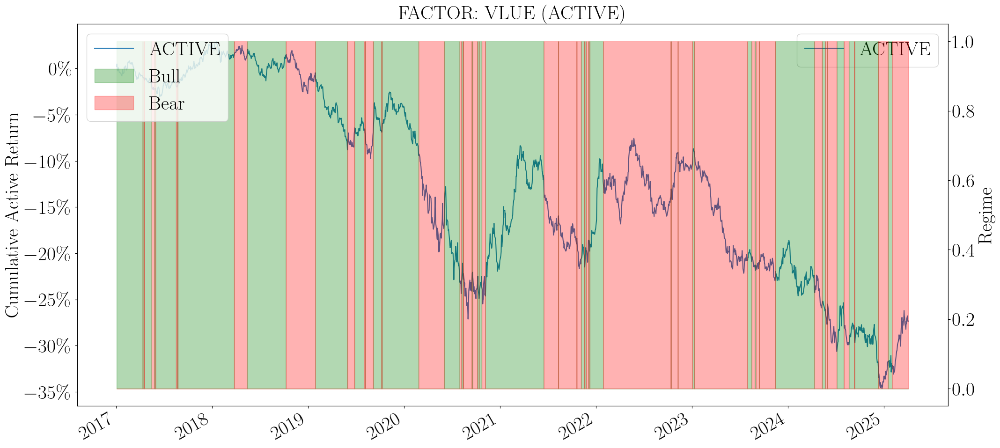

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from jumpmodels.plot import plot_regimes_and_cumret

start = pd.Timestamp("2017-01-01")

for fac in factors:
    # load and align
    regimes    = factor_views[fac]["state"].dropna().astype(int)
    ret_raw    = factor_data_dict[fac]["fac_ret"].dropna()
    ret_active = factor_data_dict[fac]["active_ret"].dropna()

    # get common dates, then cut from 2017 on
    idx_raw    = regimes.index.intersection(ret_raw.index)
    idx_raw    = idx_raw[idx_raw >= start]
    idx_active = regimes.index.intersection(ret_active.index)
    idx_active = idx_active[idx_active >= start]

    # ---------- raw factor return ----------
    ax_raw, _ = plot_regimes_and_cumret(
        regimes.loc[idx_raw],
        ret_raw.loc[idx_raw],
        n_c=2,
        colors_regimes=['g','r'],
        labels_regimes=['Bull','Bear'],
        legend_loc='upper left'
    )
    ax_raw.set_title(f"FACTOR: {fac.upper()}")
    plt.show()

    # ---------- active return ----------
    # capitalize column name
    active_df = ret_active.loc[idx_active].to_frame("ACTIVE")
    ax_act, _ = plot_regimes_and_cumret(
        regimes.loc[idx_active],
        active_df,
        n_c=2,
        colors_regimes=['g','r'],
        labels_regimes=['Bull','Bear'],
        ylabel_ret="Cumulative Active Return",
        legend_loc='upper left'
    )
    ax_act.set_title(f"Factor: {fac.upper()} (Active)")
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from jumpmodels.plot import plot_regimes_and_cumret
import re

start = pd.Timestamp("2017-01-01")

def title_to_filename(title):
    # replace non-alphanumerics with underscore and lowercase
    fname = re.sub(r'[^0-9a-zA-Z]+', '_', title).strip('_').lower()
    return f"{fname}.png"

for fac in factors:
    # load and align
    regimes    = factor_views[fac]["state"].dropna().astype(int)
    ret_raw    = factor_data_dict[fac]["fac_ret"].dropna()
    ret_active = factor_data_dict[fac]["active_ret"].dropna()

    idx_raw    = regimes.index.intersection(ret_raw.index)
    idx_raw    = idx_raw[idx_raw >= start]
    idx_active = regimes.index.intersection(ret_active.index)
    idx_active = idx_active[idx_active >= start]

    # ---------- raw factor return ----------
    ax_raw, _ = plot_regimes_and_cumret(
        regimes.loc[idx_raw],
        ret_raw.loc[idx_raw],
        n_c=2,
        colors_regimes=['g','r'],
        labels_regimes=['Bull','Bear'],
        legend_loc='upper left'
    )
    title_raw = f"FACTOR: {fac.upper()}"
    ax_raw.set_title(title_raw)
    fig_raw = ax_raw.get_figure()
    fig_raw.savefig(title_to_filename(title_raw), bbox_inches='tight')
    plt.close(fig_raw)

    # ---------- active return ----------
    active_df = ret_active.loc[idx_active].to_frame("ACTIVE")
    ax_act, _ = plot_regimes_and_cumret(
        regimes.loc[idx_active],
        active_df,
        n_c=2,
        colors_regimes=['g','r'],
        labels_regimes=['Bull','Bear'],
        ylabel_ret="Cumulative Active Return",
        legend_loc='upper left'
    )
    title_act = f"Factor: {fac.upper()} (Active)"
    ax_act.set_title(title_act)
    fig_act = ax_act.get_figure()
    fig_act.savefig(title_to_filename(title_act), bbox_inches='tight')
    plt.close(fig_act)
